<a href="https://colab.research.google.com/github/kHarshit/Colorization-of-paintings-GANs/blob/main/ImageColorization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Bringing Vibrance to historical paintings through Image Colorization

In [ ]:
import torch
from torch import nn, optim
from torchvision import transforms
from torchvision.utils import make_grid
from torch.utils.data import Dataset, DataLoader
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
import os
import glob
import time
import numpy as np
from PIL import Image
from pathlib import Path
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
from skimage.color import rgb2lab, lab2rgb, rgb2gray


In [ ]:
# !pip install fastai==2.4
# run this intially
# then restart the runtime
# then do not run this , comment this it out

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 187.9/187.9 kB 4.3 MB/s eta 0:00:00
ERROR: Could not find a version that satisfies the requirement torch<1.10,>=1.7.0 (from fastai) (from versions: 1.11.0, 1.12.0, 1.12.1, 1.13.0, 1.13.1, 2.0.0)
ERROR: No matching distribution found for torch<1.10,>=1.7.0


# Preprocessing

In [ ]:
# splits the data
def datasplit():
  path = '/content/drive/MyDrive/ML_Project/dataset'
  paths = glob.glob(path + "/*.jpg")
  np.random.seed(123)
  paths_subset = np.random.choice(paths, len(paths), replace=False)
  rand_index = np.random.permutation(len(paths))
  # splitting to training, validation and testing dataset
  training_index = rand_index[:int(len(paths)*(0.7))]
  val_index = rand_index[int(len(paths)*(0.7)):int(len(paths)*(0.8))]
  test_index = rand_index[int(len(paths)*(0.8)):]
  print(len(training_index),len(val_index),len(test_index))
  training_path = paths_subset[training_index]
  val_path = paths_subset[val_index]
  testing_path = paths_subset[test_index]
  return training_path,val_path,testing_path

# colorization and transformation of dataset
class TransformationDataset(Dataset):
  def __init__(self,paths,split='train'):
    self.split = split
    self.size = 256
    self.paths = paths
    if split == 'train':
      self.transforms = transforms.Compose([transforms.Resize((256, 256),  Image.BICUBIC),transforms.RandomHorizontalFlip()])
    elif split == 'test' or split == 'val':
      self.transforms = transforms.Resize((256, 256),  Image.BICUBIC)

  def __getitem__(self, idx):
    img = Image.open(self.paths[idx]).convert("RGB")
    img = self.transforms(img)
    img = np.array(img)
    img_lab = rgb2lab(img).astype("float32")
    img_lab = transforms.ToTensor()(img_lab)
    L = img_lab[[0], ...] / 50. - 1.
    ab = img_lab[[1, 2], ...] / 110.

    return {'L': L, 'ab': ab}

  def __len__(self):
    return len(self.paths)

def make_dataloaders(batch_size=16, n_workers=4, pin_memory=True, **kwargs): # A handy function to make our dataloaders
    dataset = TransformationDataset(**kwargs)
    dataloader = DataLoader(dataset, batch_size=batch_size, num_workers=n_workers,
                            pin_memory=pin_memory)
    return dataloader

training_path,val_path,testing_path = datasplit()
train_dataset = make_dataloaders(paths=training_path, split='train')
val_dataset = make_dataloaders(paths=training_path, split='val')
test_dataset = make_dataloaders(paths=testing_path, split='test')

data = next(iter(train_dataset))
Ls, abs_ = data['L'], data['ab']
print(Ls.shape, abs_.shape)
print(len(train_dataset),len(val_dataset),len(test_dataset))

363 52 104


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


torch.Size([16, 1, 256, 256]) torch.Size([16, 2, 256, 256])
23 23 7


# UNet (also used as Generator for pix2pix)

In [ ]:
# Code for Unet Block
class UnetBlock(nn.Module):
    def __init__(self, nf, ni, submodule=None, input_c=None, dropout=False,innermost=False, outermost=False):
        super().__init__()
        self.outermost = outermost
        if input_c is None: input_c = nf
        downconv = nn.Conv2d(input_c, ni, kernel_size=4,stride=2, padding=1, bias=False)
        downrelu = nn.LeakyReLU(0.2, True)
        downnorm = nn.BatchNorm2d(ni)
        uprelu = nn.ReLU(True)
        upnorm = nn.BatchNorm2d(nf)
        if outermost:
            upconv = nn.ConvTranspose2d(ni * 2, nf, kernel_size=4,stride=2, padding=1)
            down = [downconv]
            up = [uprelu, upconv, nn.Tanh()]
            model = down + [submodule] + up
        elif innermost:
            upconv = nn.ConvTranspose2d(ni, nf, kernel_size=4,stride=2, padding=1, bias=False)
            down = [downrelu, downconv]
            up = [uprelu, upconv, upnorm]
            model = down + up
        else:
            upconv = nn.ConvTranspose2d(ni * 2, nf, kernel_size=4,stride=2, padding=1, bias=False)
            down = [downrelu, downconv, downnorm]
            up = [uprelu, upconv, upnorm]
            if dropout: up += [nn.Dropout(0.5)]
            model = down + [submodule] + up
        self.model = nn.Sequential(*model)

    def forward(self, x):
        if self.outermost:
            return self.model(x)
        else:
            return torch.cat([x, self.model(x)], 1)

#class that uses Unet block to implement Unet
class Unet(nn.Module):
    def __init__(self, input_c=1, output_c=2, n_down=8, num_filters=64):
        super().__init__()
        unet_block = UnetBlock(num_filters * 8, num_filters * 8, innermost=True)
        for _ in range(n_down - 5):
            unet_block = UnetBlock(num_filters * 8, num_filters * 8, submodule=unet_block, dropout=True)
        out_filters = num_filters * 8
        for _ in range(3):
            unet_block = UnetBlock(out_filters // 2, out_filters, submodule=unet_block)
            out_filters //= 2
        self.model = UnetBlock(output_c, out_filters, input_c=input_c, submodule=unet_block, outermost=True)

    def forward(self, x):
        return self.model(x)

# Discriminator

In [ ]:
# code for the patch discriminator block which is used by the discriminator block
class PatchDiscriminator(nn.Module):
  def __init__(self, input_c, num_filters=64, n_down=3):
    super().__init__()
    model = [self.get_layers(input_c, num_filters, norm=False)]
    model += [self.get_layers(num_filters * 2 ** i, num_filters * 2 ** (i + 1), s=1 if i == (n_down-1) else 2) for i in range(n_down)]
    model += [self.get_layers(num_filters * 2 ** n_down, 1, s=1, norm=False, act=False)]
    self.model = nn.Sequential(*model)
  def get_layers(self, ni, nf, k=4, s=2, p=1, norm=True, act=True):
    layers = [nn.Conv2d(ni, nf, k, s, p, bias=not norm)]
    if norm:
      layers += [nn.BatchNorm2d(nf)]
    if act:
      layers += [nn.LeakyReLU(0.2, True)]
    return nn.Sequential(*layers)
  def forward(self, x):
    return self.model(x)

In [ ]:

# discriminator block where batch_size, channels, and size of the image is specified
discriminator = PatchDiscriminator(3)
dummy_input = torch.randn(16, 3, 256, 256)
out = discriminator(dummy_input)
out.shape

torch.Size([16, 1, 30, 30])

# Loss function

In [ ]:
# Gan loss class function which takes in different gan modes like 'vanilla','lsgan' for decinding the loss function
class GANLoss(nn.Module):
    def __init__(self, gan_mode='vanilla', real_label=1.0, fake_label=0.0):
        super().__init__()
        self.register_buffer('real_label', torch.tensor(real_label))
        self.register_buffer('fake_label', torch.tensor(fake_label))
        if gan_mode == 'vanilla':
            self.loss = nn.BCEWithLogitsLoss()
        elif gan_mode == 'lsgan':
            self.loss = nn.MSELoss()

    def get_labels(self, preds, target_is_real):
        if target_is_real:
            labels = self.real_label
        else:
            labels = self.fake_label
        return labels.expand_as(preds)

    def __call__(self, preds, target_is_real):
        labels = self.get_labels(preds, target_is_real)
        loss = self.loss(preds, labels)
        return loss

# this function helps to initialize the functions of the network based on whether the initiation is norm,xavier,kaiming
def init_weights(net, init='norm', gain=0.02):
    def init_func(m):
        classname = m.__class__.__name__
        if hasattr(m, 'weight') and 'Conv' in classname:
            if init == 'norm':
                nn.init.normal_(m.weight.data, mean=0.0, std=gain)
            elif init == 'xavier':
                nn.init.xavier_normal_(m.weight.data, gain=gain)
            elif init == 'kaiming':
                nn.init.kaiming_normal_(m.weight.data, a=0, mode='fan_in')

            if hasattr(m, 'bias') and m.bias is not None:
                nn.init.constant_(m.bias.data, 0.0)
        elif 'BatchNorm2d' in classname:
            nn.init.normal_(m.weight.data, 1., gain)
            nn.init.constant_(m.bias.data, 0.)
    net.apply(init_func)
    print(f"model initialized with {init} initialization")
    return net
# intialize the model by adding it to the device (which could be GPU or CPU)
# intialize the model using the init weight function
def init_model(model, device):
    model = model.to(device)
    model = init_weights(model)
    return model

# Main model that intialized the learning rates for discriminator and generator.
# Createa a model that combines the generator with the discriminator.
class MainModel(nn.Module):
    def __init__(self, net_G=None, lr_G=2e-3, lr_D=2e-3, beta1=0.5, beta2=0.999, lambda_L1=100.):
        super().__init__()
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.lambda_L1 = lambda_L1
        if net_G is None:
            self.net_G = init_model(Unet(input_c=1, output_c=2, n_down=8, num_filters=64), self.device)
        else:
            self.net_G = net_G.to(self.device)
        self.net_D = init_model(PatchDiscriminator(input_c=3, n_down=3, num_filters=64), self.device)
        self.GANcriterion = GANLoss(gan_mode='vanilla').to(self.device)
        self.L1criterion = nn.L1Loss()
        self.opt_G = optim.Adam(self.net_G.parameters(), lr=lr_G, betas=(beta1, beta2))
        self.opt_D = optim.Adam(self.net_D.parameters(), lr=lr_D, betas=(beta1, beta2))

    def set_requires_grad(self, model, requires_grad=True):
        for p in model.parameters():
            p.requires_grad = requires_grad

    def setup_input(self, data):
        self.L = data['L'].to(self.device)
        self.ab = data['ab'].to(self.device)

    def forward(self):
        self.fake_color = self.net_G(self.L)

    def backward_D(self):
        fake_image = torch.cat([self.L, self.fake_color], dim=1)
        fake_preds = self.net_D(fake_image.detach())
        self.loss_D_fake = self.GANcriterion(fake_preds, False)
        real_image = torch.cat([self.L, self.ab], dim=1)
        real_preds = self.net_D(real_image)
        self.loss_D_real = self.GANcriterion(real_preds, True)
        self.loss_D = (self.loss_D_fake + self.loss_D_real) * 0.5
        self.loss_D.backward()

    def backward_G(self):
        fake_image = torch.cat([self.L, self.fake_color], dim=1)
        fake_preds = self.net_D(fake_image)
        self.loss_G_GAN = self.GANcriterion(fake_preds, True)
        self.loss_G_L1 = self.L1criterion(self.fake_color, self.ab) * self.lambda_L1
        self.loss_G = self.loss_G_GAN + self.loss_G_L1
        self.loss_G.backward()

    def optimize(self):
        self.forward()
        self.net_D.train()
        self.set_requires_grad(self.net_D, True)
        self.opt_D.zero_grad()
        self.backward_D()
        self.opt_D.step()
        self.net_G.train()
        self.set_requires_grad(self.net_D, False)
        self.opt_G.zero_grad()
        self.backward_G()
        self.opt_G.step()

In [ ]:
# this class helps to update the weights of losses for the generator while training
class AverageMeter:
    def __init__(self):
        self.reset()

    def reset(self):
        self.count, self.avg, self.sum = [0.] * 3

    def update(self, val, count=1):
        self.count += count
        self.sum += count * val
        self.avg = self.sum / self.count

# this function helps to get the real and fake loss of the Discriminator,
# L1 and GAN loss of the generator
def create_loss_meters():
    loss_D_fake = AverageMeter()
    loss_D_real = AverageMeter()
    loss_D = AverageMeter()
    loss_G_GAN = AverageMeter()
    loss_G_L1 = AverageMeter()
    loss_G = AverageMeter()

    return {'loss_D_fake': loss_D_fake,
            'loss_D_real': loss_D_real,
            'loss_D': loss_D,
            'loss_G_GAN': loss_G_GAN,
            'loss_G_L1': loss_G_L1,
            'loss_G': loss_G}

# This function helps to update the loss of the model
def update_losses(model, loss_meter_dict, count):
    for loss_name, loss_meter in loss_meter_dict.items():
        loss = getattr(model, loss_name)
        loss_meter.update(loss.item(), count=count)

# This function helps to convert image from Lab space to the RGB space
def lab_to_rgb(L, ab):
    L = (L + 1.) * 50.
    ab = ab * 110.
    Lab = torch.cat([L, ab], dim=1).permute(0, 2, 3, 1).cpu().numpy()
    rgb_imgs = []
    for img in Lab:
        img_rgb = lab2rgb(img)
        rgb_imgs.append(img_rgb)
    return np.stack(rgb_imgs, axis=0)

# This function prints all the losses that were computed in the create_loss_meters() function
def log_results(loss_meter_dict):
    for loss_name, loss_meter in loss_meter_dict.items():
        print(f"{loss_name}: {loss_meter.avg:.5f}")

# Plotting helper functions

In [ ]:
# plot the discriminator and generator losses for training dataset
def plot_loss(losses, title,epochs_final):
    plt.figure(figsize=(10, 6))
    loss_G, loss_D = [], []
    epochs = [i for i in range(1,epochs_final+1)]
    for loss in losses:
        loss_G.append(loss['loss_G'].avg)
        loss_D.append(loss['loss_D'].avg)
    plt.plot(epochs,loss_G, label='Generator')
    plt.plot(epochs,loss_D, label='Discrimator')
    plt.legend(loc='upper right', fontsize=14)
    plt.title(title, fontsize=16)
    plt.xlabel('Epoch', fontsize=14)
    plt.ylabel('Loss', fontsize=14)
    plt.savefig('/content/drive/MyDrive/ML_Project/Graphs/'+title+'.png')
    plt.show()

# Plot the loss for the Unet module
def plot_loss_generator(losses, title,epochs_final):
    plt.figure(figsize=(10, 6))
    epochs = [i for i in range(1,epochs_final+1)]
    plt.plot(epochs,losses)
    plt.title(title, fontsize=16)
    plt.xlabel('Epoch', fontsize=14)
    plt.ylabel('Loss', fontsize=14)
    plt.savefig('/content/drive/MyDrive/ML_Project/Graphs/'+title+'.png')
    plt.show()
# Plot the MSE loss for the validation and the Training MSE losses
def plot_mseloss(val_mse, training_mse,title,epochs_final):
    plt.figure(figsize=(10, 6))
    epochs = [i for i in range(1,epochs_final+1)]
    plt.plot(epochs,training_mse,color = 'blue')
    plt.plot(epochs,val_mse,color = 'red')
    plt.legend(['Train MSE Loss','Validation MSE Loss'],loc = 'upper right')
    plt.title(title, fontsize=16)
    plt.xlabel('Epoch', fontsize=14)
    plt.ylabel('MSE Loss', fontsize=14)
    plt.savefig('/content/drive/MyDrive/ML_Project/Graphs/'+title+'.png')
    plt.show()

In [ ]:
# This function helps to compute the mse loss and the generator and discriminator losses
def prediction(dataset,model):
  losses = []
  loss_meter_dict = create_loss_meters()
  device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
  model = model.to(device)
  model.eval()
  mse_losses = []
  with torch.no_grad():
    for data in tqdm(dataset):
      preds = model.net_G(data['L'].to(device))
      loss = torch.nn.MSELoss()
      mse_losses.append(loss(preds.cpu(),data['ab']).item())
      update_losses(model, loss_meter_dict, count=data['L'].size(0))
  print(sum(mse_losses)/len(mse_losses))
  return (sum(mse_losses)/len(mse_losses)),loss_meter_dict

# Training

In [ ]:
# this function helps to train model
# computes the training loss, validaiton losses, MSE loss
def train_model(model, train_dl, val_dataset,epochs):
    losses = []
    mse_loss_val_losses = []
    mse_loss_train_losses = []
    val_losses = []
    # initialize with very high value
    mse_loss_val = 10000
    for e in range(epochs):
        loss_meter_dict = create_loss_meters()
        i = 0
        for data in tqdm(train_dl):
            model.setup_input(data)
            model.optimize()
            update_losses(model, loss_meter_dict, count=data['L'].size(0))
            i += 1
        print(f"\nEpoch {e+1}/{epochs}")
        print(f"Iteration {i}/{len(train_dl)}")
        log_results(loss_meter_dict)
        losses.append(loss_meter_dict)
        new_valloss,val_dict = prediction(val_dataset,model)
        mse_loss_val = new_valloss
        mse_loss_train,train_dictionary = prediction(train_dl,model)
        mse_loss_val_losses.append(mse_loss_val)
        mse_loss_train_losses.append(mse_loss_train)
        val_losses.append(val_dict)

        # if(new_valloss>mse_loss_val):
        #   break
        # else:
        #   mse_loss_val = new_valloss
    return losses,mse_loss_val_losses,mse_loss_train_losses,e+1,val_losses




# Model 1: pix2pix (scratch UNet)

In [ ]:
# runs the main model for the Unet Scratch
model_Unet_Scratch = MainModel()
losses_model_Unet_Scratch,mse_loss_val_losses_Unet_Scratch,mse_loss_train_losses_Unet_Scratch,epochs_final,val_losses_model_Unet_Scratch = train_model(
    model_Unet_Scratch, train_dataset, val_dataset,50)
print(mse_loss_val_losses_Unet_Scratch)
print(mse_loss_train_losses_Unet_Scratch)

model initialized with norm initialization
model initialized with norm initialization


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 1/50
Iteration 23/23
loss_D_fake: 1.25852
loss_D_real: 1.39806
loss_D: 1.32829
loss_G_GAN: 1.41176
loss_G_L1: 11.20891
loss_G: 12.62067


  0%|          | 0/23 [00:00<?, ?it/s]

0.01725759033275687


  0%|          | 0/23 [00:00<?, ?it/s]

0.017257898033637066


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 2/50
Iteration 23/23
loss_D_fake: 0.77765
loss_D_real: 0.78040
loss_D: 0.77903
loss_G_GAN: 0.85785
loss_G_L1: 9.60155
loss_G: 10.45940


  0%|          | 0/23 [00:00<?, ?it/s]

0.017430047585588436


  0%|          | 0/23 [00:00<?, ?it/s]

0.0174296990684841


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 3/50
Iteration 23/23
loss_D_fake: 0.78477
loss_D_real: 0.75496
loss_D: 0.76986
loss_G_GAN: 0.91535
loss_G_L1: 9.38449
loss_G: 10.29984


  0%|          | 0/23 [00:00<?, ?it/s]

0.01766674698370954


  0%|          | 0/23 [00:00<?, ?it/s]

0.017506596915747807


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 4/50
Iteration 23/23
loss_D_fake: 0.70589
loss_D_real: 0.68970
loss_D: 0.69779
loss_G_GAN: 0.98076
loss_G_L1: 9.26457
loss_G: 10.24533


  0%|          | 0/23 [00:00<?, ?it/s]

0.020599065065059975


  0%|          | 0/23 [00:00<?, ?it/s]

0.020561070626844532


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 5/50
Iteration 23/23
loss_D_fake: 0.77976
loss_D_real: 0.74184
loss_D: 0.76080
loss_G_GAN: 1.41315
loss_G_L1: 9.97619
loss_G: 11.38934


  0%|          | 0/23 [00:00<?, ?it/s]

0.020704893354812393


  0%|          | 0/23 [00:00<?, ?it/s]

0.020845231114198334


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 6/50
Iteration 23/23
loss_D_fake: 0.70412
loss_D_real: 0.83074
loss_D: 0.76743
loss_G_GAN: 1.04932
loss_G_L1: 9.08843
loss_G: 10.13775


  0%|          | 0/23 [00:00<?, ?it/s]

0.016555554881367996


  0%|          | 0/23 [00:00<?, ?it/s]

0.01657257783834053


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 7/50
Iteration 23/23
loss_D_fake: 0.64325
loss_D_real: 0.74279
loss_D: 0.69302
loss_G_GAN: 1.31108
loss_G_L1: 8.98691
loss_G: 10.29799


  0%|          | 0/23 [00:00<?, ?it/s]

0.015585192276731781


  0%|          | 0/23 [00:00<?, ?it/s]

0.015529273361291574


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 8/50
Iteration 23/23
loss_D_fake: 0.60807
loss_D_real: 0.70639
loss_D: 0.65723
loss_G_GAN: 1.37243
loss_G_L1: 8.85707
loss_G: 10.22950


  0%|          | 0/23 [00:00<?, ?it/s]

0.016361426157147987


  0%|          | 0/23 [00:00<?, ?it/s]

0.01634080748519172


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 9/50
Iteration 23/23
loss_D_fake: 0.66627
loss_D_real: 0.66397
loss_D: 0.66512
loss_G_GAN: 1.39517
loss_G_L1: 9.04198
loss_G: 10.43715


  0%|          | 0/23 [00:00<?, ?it/s]

0.016669933522201103


  0%|          | 0/23 [00:00<?, ?it/s]

0.016910268560699795


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 10/50
Iteration 23/23
loss_D_fake: 0.83745
loss_D_real: 0.72373
loss_D: 0.78059
loss_G_GAN: 1.49905
loss_G_L1: 9.02309
loss_G: 10.52215


  0%|          | 0/23 [00:00<?, ?it/s]

0.015189823006158289


  0%|          | 0/23 [00:00<?, ?it/s]

0.0151135945773643


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 11/50
Iteration 23/23
loss_D_fake: 0.72104
loss_D_real: 0.66946
loss_D: 0.69525
loss_G_GAN: 1.03982
loss_G_L1: 8.88071
loss_G: 9.92052


  0%|          | 0/23 [00:00<?, ?it/s]

0.015140136177449123


  0%|          | 0/23 [00:00<?, ?it/s]

0.015053314278307169


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 12/50
Iteration 23/23
loss_D_fake: 0.64830
loss_D_real: 0.64517
loss_D: 0.64674
loss_G_GAN: 1.08735
loss_G_L1: 8.89732
loss_G: 9.98466


  0%|          | 0/23 [00:00<?, ?it/s]

0.014593198166593262


  0%|          | 0/23 [00:00<?, ?it/s]

0.014439539214515167


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 13/50
Iteration 23/23
loss_D_fake: 0.74067
loss_D_real: 0.67142
loss_D: 0.70604
loss_G_GAN: 1.19574
loss_G_L1: 8.78265
loss_G: 9.97839


  0%|          | 0/23 [00:00<?, ?it/s]

0.014808918956829153


  0%|          | 0/23 [00:00<?, ?it/s]

0.014855558538566465


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 14/50
Iteration 23/23
loss_D_fake: 0.66317
loss_D_real: 0.62661
loss_D: 0.64489
loss_G_GAN: 1.14101
loss_G_L1: 8.86349
loss_G: 10.00450


  0%|          | 0/23 [00:00<?, ?it/s]

0.01482981807835724


  0%|          | 0/23 [00:00<?, ?it/s]

0.014777048369464666


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 15/50
Iteration 23/23
loss_D_fake: 0.63987
loss_D_real: 0.57807
loss_D: 0.60897
loss_G_GAN: 1.14431
loss_G_L1: 8.72083
loss_G: 9.86514


  0%|          | 0/23 [00:00<?, ?it/s]

0.016194192004268585


  0%|          | 0/23 [00:00<?, ?it/s]

0.01657990839980219


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 16/50
Iteration 23/23
loss_D_fake: 0.69326
loss_D_real: 0.66804
loss_D: 0.68065
loss_G_GAN: 1.25973
loss_G_L1: 8.79354
loss_G: 10.05327


  0%|          | 0/23 [00:00<?, ?it/s]

0.013178945680999237


  0%|          | 0/23 [00:00<?, ?it/s]

0.013175300990595766


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 17/50
Iteration 23/23
loss_D_fake: 0.67617
loss_D_real: 0.59412
loss_D: 0.63514
loss_G_GAN: 1.06430
loss_G_L1: 8.78455
loss_G: 9.84884


  0%|          | 0/23 [00:00<?, ?it/s]

0.01663364093426777


  0%|          | 0/23 [00:00<?, ?it/s]

0.01671904252599115


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 18/50
Iteration 23/23
loss_D_fake: 0.61889
loss_D_real: 0.64624
loss_D: 0.63257
loss_G_GAN: 1.12147
loss_G_L1: 8.80654
loss_G: 9.92801


  0%|          | 0/23 [00:00<?, ?it/s]

0.018252864965926045


  0%|          | 0/23 [00:00<?, ?it/s]

0.01820219263596379


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 19/50
Iteration 23/23
loss_D_fake: 0.62644
loss_D_real: 0.58157
loss_D: 0.60401
loss_G_GAN: 1.26692
loss_G_L1: 9.28653
loss_G: 10.55345


  0%|          | 0/23 [00:00<?, ?it/s]

0.015062932410965795


  0%|          | 0/23 [00:00<?, ?it/s]

0.015342232042356678


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 20/50
Iteration 23/23
loss_D_fake: 0.60773
loss_D_real: 0.66516
loss_D: 0.63644
loss_G_GAN: 1.13889
loss_G_L1: 8.80979
loss_G: 9.94868


  0%|          | 0/23 [00:00<?, ?it/s]

0.014435974921545257


  0%|          | 0/23 [00:00<?, ?it/s]

0.01410565634622522


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 21/50
Iteration 23/23
loss_D_fake: 0.61789
loss_D_real: 0.62516
loss_D: 0.62153
loss_G_GAN: 1.20092
loss_G_L1: 8.54094
loss_G: 9.74186


  0%|          | 0/23 [00:00<?, ?it/s]

0.013887906588775955


  0%|          | 0/23 [00:00<?, ?it/s]

0.013695054869774891


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 22/50
Iteration 23/23
loss_D_fake: 0.60109
loss_D_real: 0.67246
loss_D: 0.63677
loss_G_GAN: 1.25813
loss_G_L1: 8.58854
loss_G: 9.84668


  0%|          | 0/23 [00:00<?, ?it/s]

0.013631661463042965


  0%|          | 0/23 [00:00<?, ?it/s]

0.013272773919870024


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 23/50
Iteration 23/23
loss_D_fake: 0.62998
loss_D_real: 0.60663
loss_D: 0.61830
loss_G_GAN: 1.20775
loss_G_L1: 8.49127
loss_G: 9.69902


  0%|          | 0/23 [00:00<?, ?it/s]

0.013000093501709078


  0%|          | 0/23 [00:00<?, ?it/s]

0.012919823963033117


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 24/50
Iteration 23/23
loss_D_fake: 0.58764
loss_D_real: 0.56044
loss_D: 0.57404
loss_G_GAN: 1.17259
loss_G_L1: 8.50660
loss_G: 9.67918


  0%|          | 0/23 [00:00<?, ?it/s]

0.013243244151058405


  0%|          | 0/23 [00:00<?, ?it/s]

0.013056693456905044


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 25/50
Iteration 23/23
loss_D_fake: 0.61876
loss_D_real: 0.65161
loss_D: 0.63518
loss_G_GAN: 1.16007
loss_G_L1: 8.36211
loss_G: 9.52218


  0%|          | 0/23 [00:00<?, ?it/s]

0.01477555637045399


  0%|          | 0/23 [00:00<?, ?it/s]

0.01468195170973954


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 26/50
Iteration 23/23
loss_D_fake: 0.75765
loss_D_real: 0.66775
loss_D: 0.71270
loss_G_GAN: 1.22757
loss_G_L1: 8.31791
loss_G: 9.54548


  0%|          | 0/23 [00:00<?, ?it/s]

0.013077564112356176


  0%|          | 0/23 [00:00<?, ?it/s]

0.0129640676567088


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 27/50
Iteration 23/23
loss_D_fake: 0.65079
loss_D_real: 0.55961
loss_D: 0.60520
loss_G_GAN: 1.20426
loss_G_L1: 8.30229
loss_G: 9.50655


  0%|          | 0/23 [00:00<?, ?it/s]

0.015141705496479635


  0%|          | 0/23 [00:00<?, ?it/s]

0.015102397933926271


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 28/50
Iteration 23/23
loss_D_fake: 0.56964
loss_D_real: 0.61760
loss_D: 0.59362
loss_G_GAN: 1.11890
loss_G_L1: 8.35938
loss_G: 9.47828


  0%|          | 0/23 [00:00<?, ?it/s]

0.01590335462242365


  0%|          | 0/23 [00:00<?, ?it/s]

0.01584926199005998


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 29/50
Iteration 23/23
loss_D_fake: 0.67691
loss_D_real: 0.59562
loss_D: 0.63626
loss_G_GAN: 1.12238
loss_G_L1: 8.21837
loss_G: 9.34074


  0%|          | 0/23 [00:00<?, ?it/s]

0.013266402114506649


  0%|          | 0/23 [00:00<?, ?it/s]

0.013158763434899889


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 30/50
Iteration 23/23
loss_D_fake: 0.59121
loss_D_real: 0.67519
loss_D: 0.63320
loss_G_GAN: 1.33572
loss_G_L1: 7.99590
loss_G: 9.33161


  0%|          | 0/23 [00:00<?, ?it/s]

0.017138099986249985


  0%|          | 0/23 [00:00<?, ?it/s]

0.016830363837273224


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 31/50
Iteration 23/23
loss_D_fake: 0.61815
loss_D_real: 0.65828
loss_D: 0.63822
loss_G_GAN: 1.12100
loss_G_L1: 8.18160
loss_G: 9.30260


  0%|          | 0/23 [00:00<?, ?it/s]

0.012067802270631428


  0%|          | 0/23 [00:00<?, ?it/s]

0.012162818451938421


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 32/50
Iteration 23/23
loss_D_fake: 0.64628
loss_D_real: 0.61951
loss_D: 0.63289
loss_G_GAN: 1.04284
loss_G_L1: 8.23531
loss_G: 9.27815


  0%|          | 0/23 [00:00<?, ?it/s]

0.01933592076048903


  0%|          | 0/23 [00:00<?, ?it/s]

0.019146948728872383


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 33/50
Iteration 23/23
loss_D_fake: 0.60297
loss_D_real: 0.68071
loss_D: 0.64184
loss_G_GAN: 1.18517
loss_G_L1: 8.30734
loss_G: 9.49251


  0%|          | 0/23 [00:00<?, ?it/s]

0.012057320154069559


  0%|          | 0/23 [00:00<?, ?it/s]

0.012089123584977959


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 34/50
Iteration 23/23
loss_D_fake: 0.69496
loss_D_real: 0.63112
loss_D: 0.66304
loss_G_GAN: 1.11908
loss_G_L1: 8.19766
loss_G: 9.31675


  0%|          | 0/23 [00:00<?, ?it/s]

0.01580846949439982


  0%|          | 0/23 [00:00<?, ?it/s]

0.01557654324595047


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 35/50
Iteration 23/23
loss_D_fake: 0.65728
loss_D_real: 0.66483
loss_D: 0.66105
loss_G_GAN: 1.12247
loss_G_L1: 8.45845
loss_G: 9.58091


  0%|          | 0/23 [00:00<?, ?it/s]

0.012409646084289188


  0%|          | 0/23 [00:00<?, ?it/s]

0.012333411844852179


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 36/50
Iteration 23/23
loss_D_fake: 0.55546
loss_D_real: 0.60457
loss_D: 0.58001
loss_G_GAN: 1.17465
loss_G_L1: 8.09024
loss_G: 9.26489


  0%|          | 0/23 [00:00<?, ?it/s]

0.013377206825205813


  0%|          | 0/23 [00:00<?, ?it/s]

0.013365429866573086


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 37/50
Iteration 23/23
loss_D_fake: 0.63905
loss_D_real: 0.62021
loss_D: 0.62963
loss_G_GAN: 1.11162
loss_G_L1: 8.02523
loss_G: 9.13685


  0%|          | 0/23 [00:00<?, ?it/s]

0.012901018738098766


  0%|          | 0/23 [00:00<?, ?it/s]

0.012896651685561823


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 38/50
Iteration 23/23
loss_D_fake: 0.63249
loss_D_real: 0.56735
loss_D: 0.59992
loss_G_GAN: 1.26438
loss_G_L1: 8.04021
loss_G: 9.30460


  0%|          | 0/23 [00:00<?, ?it/s]

0.012576347905332628


  0%|          | 0/23 [00:00<?, ?it/s]

0.012612650393629852


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 39/50
Iteration 23/23
loss_D_fake: 0.62200
loss_D_real: 0.68669
loss_D: 0.65435
loss_G_GAN: 1.12770
loss_G_L1: 7.82870
loss_G: 8.95640


  0%|          | 0/23 [00:00<?, ?it/s]

0.012594192633000404


  0%|          | 0/23 [00:00<?, ?it/s]

0.012686922599602005


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 40/50
Iteration 23/23
loss_D_fake: 0.62951
loss_D_real: 0.62601
loss_D: 0.62776
loss_G_GAN: 1.07226
loss_G_L1: 7.93537
loss_G: 9.00763


  0%|          | 0/23 [00:00<?, ?it/s]

0.011799840438787056


  0%|          | 0/23 [00:00<?, ?it/s]

0.011662851654641006


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 41/50
Iteration 23/23
loss_D_fake: 0.62873
loss_D_real: 0.66043
loss_D: 0.64458
loss_G_GAN: 1.04813
loss_G_L1: 7.98757
loss_G: 9.03570


  0%|          | 0/23 [00:00<?, ?it/s]

0.01424165302887559


  0%|          | 0/23 [00:00<?, ?it/s]

0.014053896980603104


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 42/50
Iteration 23/23
loss_D_fake: 0.63668
loss_D_real: 0.64317
loss_D: 0.63992
loss_G_GAN: 1.07330
loss_G_L1: 7.82333
loss_G: 8.89663


  0%|          | 0/23 [00:00<?, ?it/s]

0.011646665470755619


  0%|          | 0/23 [00:00<?, ?it/s]

0.011562081114591463


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 43/50
Iteration 23/23
loss_D_fake: 0.60245
loss_D_real: 0.61784
loss_D: 0.61014
loss_G_GAN: 1.11919
loss_G_L1: 7.58699
loss_G: 8.70619


  0%|          | 0/23 [00:00<?, ?it/s]

0.012470822720585958


  0%|          | 0/23 [00:00<?, ?it/s]

0.012468979450995508


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 44/50
Iteration 23/23
loss_D_fake: 0.67759
loss_D_real: 0.70394
loss_D: 0.69077
loss_G_GAN: 1.00502
loss_G_L1: 7.81421
loss_G: 8.81924


  0%|          | 0/23 [00:00<?, ?it/s]

0.01206531430311177


  0%|          | 0/23 [00:00<?, ?it/s]

0.012063025598130796


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 45/50
Iteration 23/23
loss_D_fake: 0.60285
loss_D_real: 0.63514
loss_D: 0.61900
loss_G_GAN: 1.02172
loss_G_L1: 7.73821
loss_G: 8.75992


  0%|          | 0/23 [00:00<?, ?it/s]

0.011208505734153416


  0%|          | 0/23 [00:00<?, ?it/s]

0.011148986285147459


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 46/50
Iteration 23/23
loss_D_fake: 0.62503
loss_D_real: 0.62597
loss_D: 0.62550
loss_G_GAN: 1.01620
loss_G_L1: 7.70222
loss_G: 8.71842


  0%|          | 0/23 [00:00<?, ?it/s]

0.01115395604511318


  0%|          | 0/23 [00:00<?, ?it/s]

0.01107061960046058


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 47/50
Iteration 23/23
loss_D_fake: 0.60645
loss_D_real: 0.63555
loss_D: 0.62100
loss_G_GAN: 1.04490
loss_G_L1: 7.67866
loss_G: 8.72355


  0%|          | 0/23 [00:00<?, ?it/s]

0.01211269185675875


  0%|          | 0/23 [00:00<?, ?it/s]

0.012163359104939129


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 48/50
Iteration 23/23
loss_D_fake: 0.67052
loss_D_real: 0.67037
loss_D: 0.67044
loss_G_GAN: 1.11057
loss_G_L1: 7.50954
loss_G: 8.62010


  0%|          | 0/23 [00:00<?, ?it/s]

0.012153099392257307


  0%|          | 0/23 [00:00<?, ?it/s]

0.012097703191735174


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 49/50
Iteration 23/23
loss_D_fake: 0.60938
loss_D_real: 0.63619
loss_D: 0.62278
loss_G_GAN: 1.04317
loss_G_L1: 7.60129
loss_G: 8.64447


  0%|          | 0/23 [00:00<?, ?it/s]

0.011325119589657887


  0%|          | 0/23 [00:00<?, ?it/s]

0.011362533105294342


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 50/50
Iteration 23/23
loss_D_fake: 0.63889
loss_D_real: 0.63339
loss_D: 0.63614
loss_G_GAN: 1.05593
loss_G_L1: 7.59714
loss_G: 8.65307


  0%|          | 0/23 [00:00<?, ?it/s]

0.010939400035725988


  0%|          | 0/23 [00:00<?, ?it/s]

0.010890109990925892
[0.01725759033275687, 0.017430047585588436, 0.01766674698370954, 0.020599065065059975, 0.020704893354812393, 0.016555554881367996, 0.015585192276731781, 0.016361426157147987, 0.016669933522201103, 0.015189823006158289, 0.015140136177449123, 0.014593198166593262, 0.014808918956829153, 0.01482981807835724, 0.016194192004268585, 0.013178945680999237, 0.01663364093426777, 0.018252864965926045, 0.015062932410965795, 0.014435974921545257, 0.013887906588775955, 0.013631661463042965, 0.013000093501709078, 0.013243244151058405, 0.01477555637045399, 0.013077564112356176, 0.015141705496479635, 0.01590335462242365, 0.013266402114506649, 0.017138099986249985, 0.012067802270631428, 0.01933592076048903, 0.012057320154069559, 0.01580846949439982, 0.012409646084289188, 0.013377206825205813, 0.012901018738098766, 0.012576347905332628, 0.012594192633000404, 0.011799840438787056, 0.01424165302887559, 0.011646665470755619, 0.012470822720585958, 0.01206531430311177, 0.011208505734153416

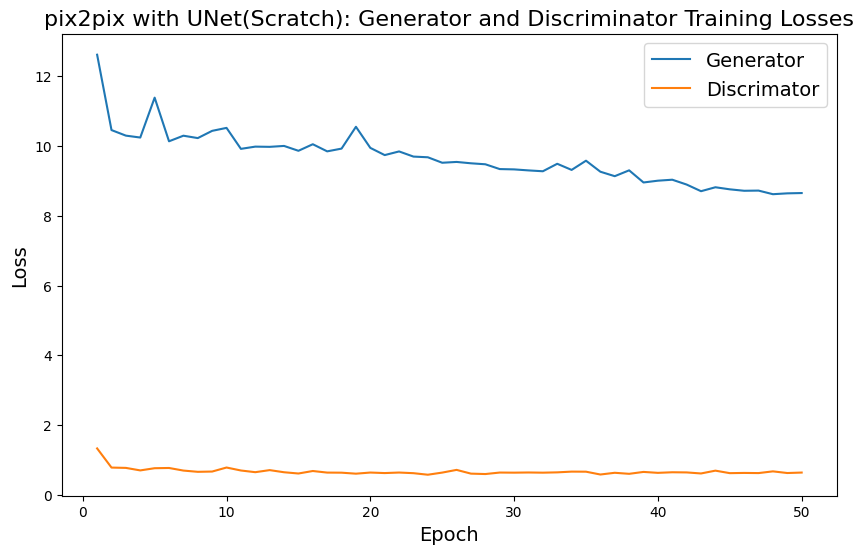

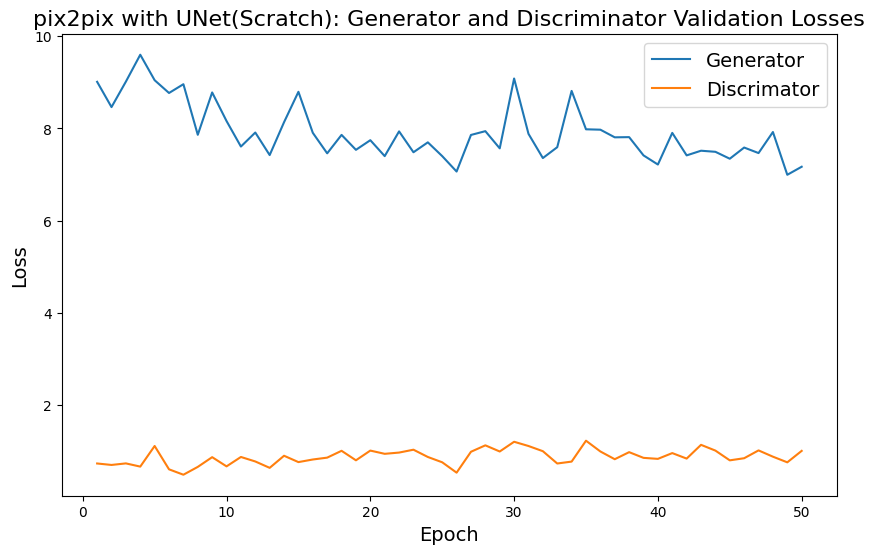

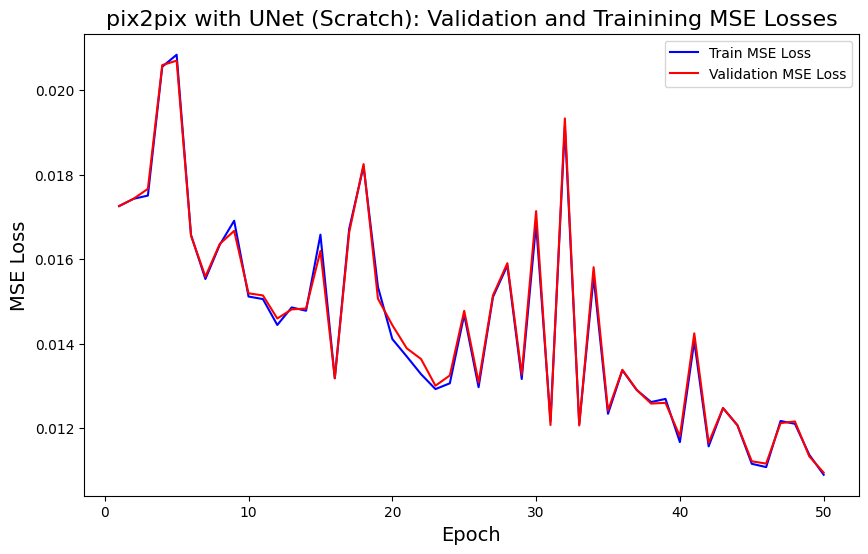

In [ ]:
# plot the losses for the model Unet from scratch
plot_loss(losses_model_Unet_Scratch, 'pix2pix with UNet(Scratch): Generator and Discriminator Training Losses',epochs_final)
plot_loss(val_losses_model_Unet_Scratch,'pix2pix with UNet(Scratch): Generator and Discriminator Validation Losses',epochs_final)
plot_mseloss(mse_loss_val_losses_Unet_Scratch, mse_loss_train_losses_Unet_Scratch,
             'pix2pix with UNet (Scratch): Validation and Trainining MSE Losses',epochs_final)

In [ ]:
# Print the model and save the model weights
print(model_Unet_Scratch)
torch.save(model_Unet_Scratch.state_dict(),"/content/drive/MyDrive/ML_Project/model_Unet_Scratch.pt")

MainModel(
  (net_G): Unet(
    (model): UnetBlock(
      (model): Sequential(
        (0): Conv2d(1, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
        (1): UnetBlock(
          (model): Sequential(
            (0): LeakyReLU(negative_slope=0.2, inplace=True)
            (1): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
            (2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (3): UnetBlock(
              (model): Sequential(
                (0): LeakyReLU(negative_slope=0.2, inplace=True)
                (1): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
                (2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
                (3): UnetBlock(
                  (model): Sequential(
                    (0): LeakyReLU(negative_slope=0.2, inplace=True)
                    (1): Conv2d(256, 512, kernel_s

# Model 2: UNet (only)

In [ ]:
from fastai.vision.learner import create_body
from torchvision.models.resnet import resnet18
from fastai.vision.models.unet import DynamicUnet
# builds residual block unet using DynamicUnet
def build_res_unet(n_input=1, n_output=2, size=256):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    body = create_body(resnet18, pretrained=True, n_in=n_input, cut=-2)
    net_G = DynamicUnet(body, n_output, (size, size)).to(device)
    return net_G
# performs prediction of mse loss and L1 loss of the Unet module
def prediction_netG(dataset,model):
  losses = []
  loss_meter_dict = AverageMeter()
  criterion = nn.L1Loss()
  device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
  model = model.to(device)
  model.eval()
  mse_losses = []
  with torch.no_grad():
    for data in tqdm(dataset):
      preds = net_G(data['L'].to(device))
      loss = torch.nn.MSELoss()
      loss2 = criterion(preds,data['ab'].to(device))
      mse_losses.append(loss(preds.cpu(),data['ab']).item())
  loss_meter_dict.update(loss2.item(), data['L'].to(device).size(0))
  print(sum(mse_losses)/len(mse_losses))
  return (sum(mse_losses)/len(mse_losses)),loss_meter_dict.avg

# trains the Unet block from scratch
def pretrain_generator(net_G, train_dl, opt, criterion, val_dataset,epochs):
    losses = []
    val_losses = []
    mse_loss_val_losses = []
    mse_loss_train_losses = []
    mse_loss_val = 1000
    for e in range(epochs):
        loss_meter = AverageMeter()
        for data in tqdm(train_dl):
            L, ab = data['L'].to(device), data['ab'].to(device)
            preds = net_G(L)
            loss = criterion(preds, ab)
            opt.zero_grad()
            loss.backward()
            opt.step()
            loss_meter.update(loss.item(), L.size(0))
        print(f"Epoch {e + 1}/{epochs}")
        print(f"L1 Loss: {loss_meter.avg:.5f}")
        losses.append(loss.item())
        new_valloss,val_dict = prediction_netG(val_dataset,net_G)
        mse_loss_val = new_valloss
        mse_loss_train,train_dictionary = prediction_netG(train_dl,net_G)
        mse_loss_val_losses.append(mse_loss_val)
        mse_loss_train_losses.append(mse_loss_train)
        val_losses.append(val_dict)
        # if(new_valloss>mse_loss_val):
        #   break
    return losses,mse_loss_val_losses,mse_loss_train_losses,e+1,val_losses


In [ ]:
# builds the Unet block, decided the optimizer as Adam Optimizer
#with learning rate as 0.0001 and loss criterion is L1 loss
net_G = build_res_unet(n_input=1, n_output=2, size=256)
opt = optim.Adam(net_G.parameters(), lr=1e-4)
criterion = nn.L1Loss()

In [ ]:
# runs the trianing block for the Unet module
losses_Unetblock,mse_loss_val_losses_Unetblock,mse_loss_train_losses_Unetblock,epochs_final,val_losses_Unetblock = pretrain_generator(net_G, train_dataset, opt, criterion, val_dataset,50)


  0%|          | 0/23 [00:00<?, ?it/s]

/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py:478: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Epoch 1/50
L1 Loss: 0.13096


  0%|          | 0/23 [00:00<?, ?it/s]

0.016064342880702537


  0%|          | 0/23 [00:00<?, ?it/s]

0.01606291378645793


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 2/50
L1 Loss: 0.09002


  0%|          | 0/23 [00:00<?, ?it/s]

0.017688457246707832


  0%|          | 0/23 [00:00<?, ?it/s]

0.017722944931491562


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 3/50
L1 Loss: 0.08633


  0%|          | 0/23 [00:00<?, ?it/s]

0.01735829201567432


  0%|          | 0/23 [00:00<?, ?it/s]

0.01738808109708454


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 4/50
L1 Loss: 0.08371


  0%|          | 0/23 [00:00<?, ?it/s]

0.015019450863094433


  0%|          | 0/23 [00:00<?, ?it/s]

0.015063440710630106


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 5/50
L1 Loss: 0.08123


  0%|          | 0/23 [00:00<?, ?it/s]

0.013442466561884983


  0%|          | 0/23 [00:00<?, ?it/s]

0.013466401025652885


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 6/50
L1 Loss: 0.08055


  0%|          | 0/23 [00:00<?, ?it/s]

0.012316237264515265


  0%|          | 0/23 [00:00<?, ?it/s]

0.012380375567337742


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 7/50
L1 Loss: 0.07887


  0%|          | 0/23 [00:00<?, ?it/s]

0.01163326311127647


  0%|          | 0/23 [00:00<?, ?it/s]

0.011613274823226358


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 8/50
L1 Loss: 0.07468


  0%|          | 0/23 [00:00<?, ?it/s]

0.011389599687865248


  0%|          | 0/23 [00:00<?, ?it/s]

0.011430916578873344


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 9/50
L1 Loss: 0.07276


  0%|          | 0/23 [00:00<?, ?it/s]

0.010144285553985315


  0%|          | 0/23 [00:00<?, ?it/s]

0.010130070656052103


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 10/50
L1 Loss: 0.07160


  0%|          | 0/23 [00:00<?, ?it/s]

0.010234955009882864


  0%|          | 0/23 [00:00<?, ?it/s]

0.010195200776924257


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 11/50
L1 Loss: 0.07576


  0%|          | 0/23 [00:00<?, ?it/s]

0.010168379982528479


  0%|          | 0/23 [00:00<?, ?it/s]

0.010222709818702677


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 12/50
L1 Loss: 0.07381


  0%|          | 0/23 [00:00<?, ?it/s]

0.01384886252977278


  0%|          | 0/23 [00:00<?, ?it/s]

0.013836754081041916


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 13/50
L1 Loss: 0.07343


  0%|          | 0/23 [00:00<?, ?it/s]

0.009539678206910257


  0%|          | 0/23 [00:00<?, ?it/s]

0.009512159689936949


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 14/50
L1 Loss: 0.06875


  0%|          | 0/23 [00:00<?, ?it/s]

0.010337910655400028


  0%|          | 0/23 [00:00<?, ?it/s]

0.010354109027463457


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 15/50
L1 Loss: 0.06780


  0%|          | 0/23 [00:00<?, ?it/s]

0.00941134254326639


  0%|          | 0/23 [00:00<?, ?it/s]

0.009433405656043602


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 16/50
L1 Loss: 0.06867


  0%|          | 0/23 [00:00<?, ?it/s]

0.008832822310859743


  0%|          | 0/23 [00:00<?, ?it/s]

0.008798242850310129


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 17/50
L1 Loss: 0.06761


  0%|          | 0/23 [00:00<?, ?it/s]

0.009538499759915083


  0%|          | 0/23 [00:00<?, ?it/s]

0.009518098308826271


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 18/50
L1 Loss: 0.06714


  0%|          | 0/23 [00:00<?, ?it/s]

0.01026700809597969


  0%|          | 0/23 [00:00<?, ?it/s]

0.010184525066743727


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 19/50
L1 Loss: 0.06672


  0%|          | 0/23 [00:00<?, ?it/s]

0.011218680311804232


  0%|          | 0/23 [00:00<?, ?it/s]

0.011187528664975063


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 20/50
L1 Loss: 0.06958


  0%|          | 0/23 [00:00<?, ?it/s]

0.010401018976193407


  0%|          | 0/23 [00:00<?, ?it/s]

0.010432358446490505


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 21/50
L1 Loss: 0.07379


  0%|          | 0/23 [00:00<?, ?it/s]

0.009030958617349033


  0%|          | 0/23 [00:00<?, ?it/s]

0.009008489630144575


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 22/50
L1 Loss: 0.07206


  0%|          | 0/23 [00:00<?, ?it/s]

0.008966096535163082


  0%|          | 0/23 [00:00<?, ?it/s]

0.008962466401736374


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 23/50
L1 Loss: 0.06805


  0%|          | 0/23 [00:00<?, ?it/s]

0.008858535519760588


  0%|          | 0/23 [00:00<?, ?it/s]

0.008797746232670286


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 24/50
L1 Loss: 0.06851


  0%|          | 0/23 [00:00<?, ?it/s]

0.009399076640281988


  0%|          | 0/23 [00:00<?, ?it/s]

0.009419391437879076


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 25/50
L1 Loss: 0.07009


  0%|          | 0/23 [00:00<?, ?it/s]

0.01040552516022454


  0%|          | 0/23 [00:00<?, ?it/s]

0.010176852021528326


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 26/50
L1 Loss: 0.07320


  0%|          | 0/23 [00:00<?, ?it/s]

0.012332994936277037


  0%|          | 0/23 [00:00<?, ?it/s]

0.012283771096364311


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 27/50
L1 Loss: 0.07530


  0%|          | 0/23 [00:00<?, ?it/s]

0.009770488447469214


  0%|          | 0/23 [00:00<?, ?it/s]

0.0097413734006493


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 28/50
L1 Loss: 0.07520


  0%|          | 0/23 [00:00<?, ?it/s]

0.013152361604506555


  0%|          | 0/23 [00:00<?, ?it/s]

0.013165986084419748


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 29/50
L1 Loss: 0.07289


  0%|          | 0/23 [00:00<?, ?it/s]

0.010705552914220354


  0%|          | 0/23 [00:00<?, ?it/s]

0.010731740125819393


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 30/50
L1 Loss: 0.06931


  0%|          | 0/23 [00:00<?, ?it/s]

0.009545166470596323


  0%|          | 0/23 [00:00<?, ?it/s]

0.009503159591037294


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 31/50
L1 Loss: 0.06682


  0%|          | 0/23 [00:00<?, ?it/s]

0.009548969182145336


  0%|          | 0/23 [00:00<?, ?it/s]

0.009538979512517866


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 32/50
L1 Loss: 0.06628


  0%|          | 0/23 [00:00<?, ?it/s]

0.008712206116837004


  0%|          | 0/23 [00:00<?, ?it/s]

0.00878901773577799


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 33/50
L1 Loss: 0.06400


  0%|          | 0/23 [00:00<?, ?it/s]

0.009418939827414959


  0%|          | 0/23 [00:00<?, ?it/s]

0.009453717032042534


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 34/50
L1 Loss: 0.06424


  0%|          | 0/23 [00:00<?, ?it/s]

0.011271717087568148


  0%|          | 0/23 [00:00<?, ?it/s]

0.011284623234330313


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 35/50
L1 Loss: 0.06494


  0%|          | 0/23 [00:00<?, ?it/s]

0.00878067264009429


  0%|          | 0/23 [00:00<?, ?it/s]

0.008859048799976059


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 36/50
L1 Loss: 0.06405


  0%|          | 0/23 [00:00<?, ?it/s]

0.007598220127756181


  0%|          | 0/23 [00:00<?, ?it/s]

0.007615321295578842


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 37/50
L1 Loss: 0.06390


  0%|          | 0/23 [00:00<?, ?it/s]

0.007509891611888357


  0%|          | 0/23 [00:00<?, ?it/s]

0.007553198698746121


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 38/50
L1 Loss: 0.06143


  0%|          | 0/23 [00:00<?, ?it/s]

0.008184536420942648


  0%|          | 0/23 [00:00<?, ?it/s]

0.008231950842815897


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 39/50
L1 Loss: 0.06058


  0%|          | 0/23 [00:00<?, ?it/s]

0.00825081939768532


  0%|          | 0/23 [00:00<?, ?it/s]

0.00827104780499054


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 40/50
L1 Loss: 0.06030


  0%|          | 0/23 [00:00<?, ?it/s]

0.008108204291404589


  0%|          | 0/23 [00:00<?, ?it/s]

0.008141061777006025


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 41/50
L1 Loss: 0.05823


  0%|          | 0/23 [00:00<?, ?it/s]

0.007447634945097177


  0%|          | 0/23 [00:00<?, ?it/s]

0.007483961931227342


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 42/50
L1 Loss: 0.05745


  0%|          | 0/23 [00:00<?, ?it/s]

0.007791929554356181


  0%|          | 0/23 [00:00<?, ?it/s]

0.007819714955985546


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 43/50
L1 Loss: 0.05754


  0%|          | 0/23 [00:00<?, ?it/s]

0.009154047877730234


  0%|          | 0/23 [00:00<?, ?it/s]

0.009122614951237389


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 44/50
L1 Loss: 0.05981


  0%|          | 0/23 [00:00<?, ?it/s]

0.009272119556756123


  0%|          | 0/23 [00:00<?, ?it/s]

0.009355081407272297


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 45/50
L1 Loss: 0.06068


  0%|          | 0/23 [00:00<?, ?it/s]

0.007397172770098499


  0%|          | 0/23 [00:00<?, ?it/s]

0.00739689645073984


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 46/50
L1 Loss: 0.05982


  0%|          | 0/23 [00:00<?, ?it/s]

0.0074192907296769


  0%|          | 0/23 [00:00<?, ?it/s]

0.007422752921348033


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 47/50
L1 Loss: 0.05875


  0%|          | 0/23 [00:00<?, ?it/s]

0.006880891489107971


  0%|          | 0/23 [00:00<?, ?it/s]

0.006859327676584539


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 48/50
L1 Loss: 0.05789


  0%|          | 0/23 [00:00<?, ?it/s]

0.009090741083997747


  0%|          | 0/23 [00:00<?, ?it/s]

0.008981207851320505


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 49/50
L1 Loss: 0.06424


  0%|          | 0/23 [00:00<?, ?it/s]

0.007200060432533855


  0%|          | 0/23 [00:00<?, ?it/s]

0.007236728748387616


  0%|          | 0/23 [00:00<?, ?it/s]

Epoch 50/50
L1 Loss: 0.06294


  0%|          | 0/23 [00:00<?, ?it/s]

0.007977864158380291


  0%|          | 0/23 [00:00<?, ?it/s]

0.008016828002165194


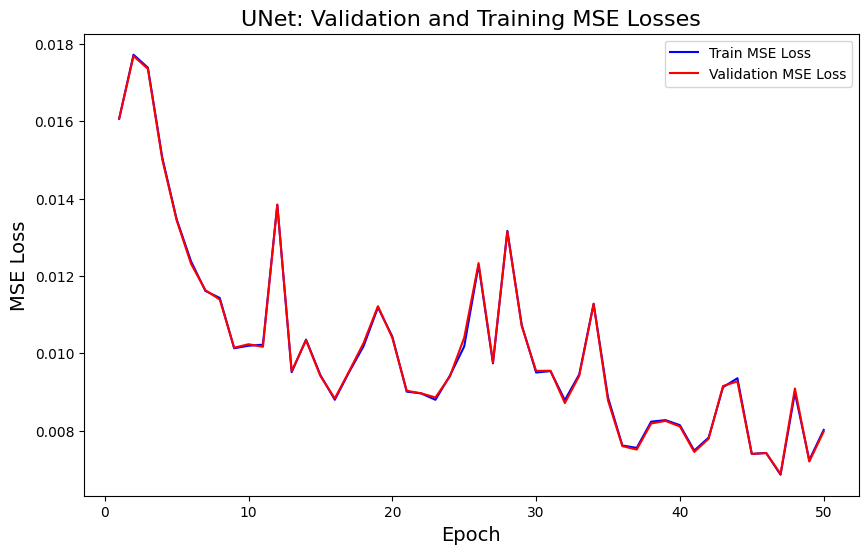

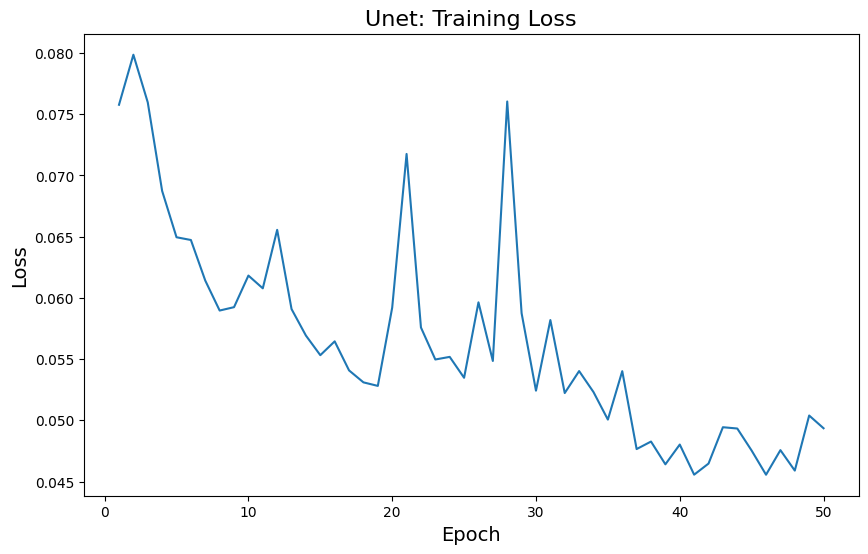

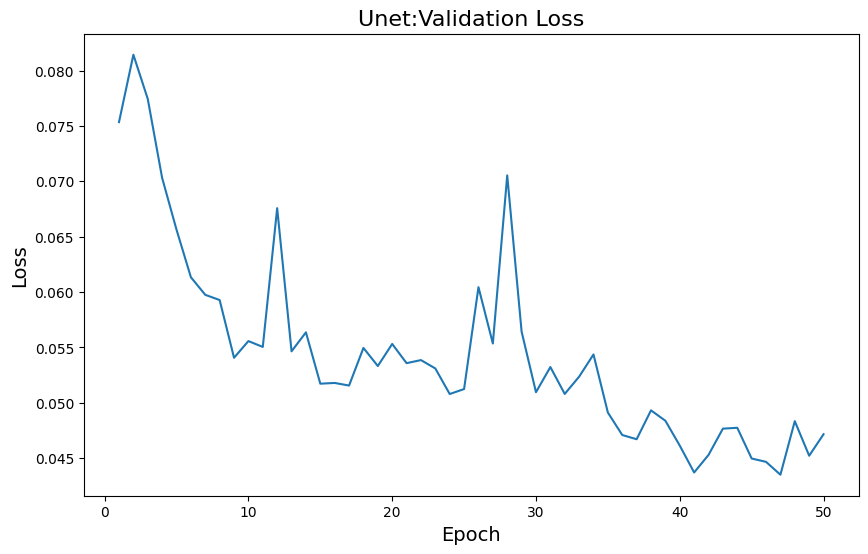

In [ ]:
# plots loss for the Unet block along with mse loss for the validation and training dataset
plot_mseloss(mse_loss_val_losses_Unetblock, mse_loss_train_losses_Unetblock,
             'UNet: Validation and Training MSE Losses',epochs_final)
plot_loss_generator(losses_Unetblock, 'Unet: Training Loss',epochs_final)
plot_loss_generator(val_losses_Unetblock, 'Unet:Validation Loss',epochs_final)

In [ ]:
# prints the network architecture
# saves the weights learnt during training of the Unet block
print(net_G)
torch.save(net_G.state_dict(), "/content/drive/MyDrive/ML_Project/res18-unet.pt")

DynamicUnet(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (4): Sequential(
        (0): BasicBlock(
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu): ReLU(inplace=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
        (1): BasicBlock(
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05

# Model 3: pix2pix (pretrained resnet18 backbone UNet)

In [ ]:
# use the pretriained Unet block combined with resent , add discriminator to it to create a final GAN network
net_G = build_res_unet(n_input=1, n_output=2, size=256)
net_G.load_state_dict(torch.load("/content/drive/MyDrive/ML_Project/res18-unet.pt", map_location=device))
Unet_pretrained_gen_dis_model = MainModel(net_G=net_G)

model initialized with norm initialization


In [ ]:
# Train the model
losses_Unet_pretrained_gen_dis_model,mse_loss_val_losses_Unet_pretrained_gen_dis_model,mse_loss_train_losses_Unet_pretrained_gen_dis_model,epochs_final,val_losses_Unet_pretrained_gen_dis_model = train_model(Unet_pretrained_gen_dis_model, train_dataset, val_dataset,50)

model initialized with norm initialization


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 1/50
Iteration 23/23
loss_D_fake: 0.80931
loss_D_real: 0.85398
loss_D: 0.83165
loss_G_GAN: 0.85628
loss_G_L1: 9.22933
loss_G: 10.08561


  0%|          | 0/23 [00:00<?, ?it/s]

0.012448910137881403


  0%|          | 0/23 [00:00<?, ?it/s]

0.012450828621892826


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 2/50
Iteration 23/23
loss_D_fake: 0.69820
loss_D_real: 0.70271
loss_D: 0.70045
loss_G_GAN: 0.77297
loss_G_L1: 7.61305
loss_G: 8.38602


  0%|          | 0/23 [00:00<?, ?it/s]

0.01121391028003848


  0%|          | 0/23 [00:00<?, ?it/s]

0.011319290016494368


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 3/50
Iteration 23/23
loss_D_fake: 0.68123
loss_D_real: 0.68206
loss_D: 0.68164
loss_G_GAN: 0.81029
loss_G_L1: 7.39219
loss_G: 8.20248


  0%|          | 0/23 [00:00<?, ?it/s]

0.009656021877637377


  0%|          | 0/23 [00:00<?, ?it/s]

0.009628385852050522


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 4/50
Iteration 23/23
loss_D_fake: 0.66415
loss_D_real: 0.66784
loss_D: 0.66600
loss_G_GAN: 0.87287
loss_G_L1: 7.04756
loss_G: 7.92043


  0%|          | 0/23 [00:00<?, ?it/s]

0.010752006251688885


  0%|          | 0/23 [00:00<?, ?it/s]

0.010740447202292473


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 5/50
Iteration 23/23
loss_D_fake: 0.66860
loss_D_real: 0.66428
loss_D: 0.66644
loss_G_GAN: 0.85477
loss_G_L1: 6.89780
loss_G: 7.75257


  0%|          | 0/23 [00:00<?, ?it/s]

0.009148779001248919


  0%|          | 0/23 [00:00<?, ?it/s]

0.009215534907644209


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 6/50
Iteration 23/23
loss_D_fake: 0.66074
loss_D_real: 0.66577
loss_D: 0.66325
loss_G_GAN: 0.84411
loss_G_L1: 6.49121
loss_G: 7.33533


  0%|          | 0/23 [00:00<?, ?it/s]

0.009653189907903257


  0%|          | 0/23 [00:00<?, ?it/s]

0.009638245804640263


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 7/50
Iteration 23/23
loss_D_fake: 0.66266
loss_D_real: 0.65792
loss_D: 0.66029
loss_G_GAN: 0.85615
loss_G_L1: 6.39713
loss_G: 7.25328


  0%|          | 0/23 [00:00<?, ?it/s]

0.01093260328406873


  0%|          | 0/23 [00:00<?, ?it/s]

0.010869119943969923


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 8/50
Iteration 23/23
loss_D_fake: 0.65342
loss_D_real: 0.64680
loss_D: 0.65011
loss_G_GAN: 0.89160
loss_G_L1: 6.52899
loss_G: 7.42059


  0%|          | 0/23 [00:00<?, ?it/s]

0.008962323322244312


  0%|          | 0/23 [00:00<?, ?it/s]

0.009462173825696758


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 9/50
Iteration 23/23
loss_D_fake: 0.65657
loss_D_real: 0.64504
loss_D: 0.65081
loss_G_GAN: 0.91572
loss_G_L1: 6.39873
loss_G: 7.31444


  0%|          | 0/23 [00:00<?, ?it/s]

0.00883223098176329


  0%|          | 0/23 [00:00<?, ?it/s]

0.008869218518552572


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 10/50
Iteration 23/23
loss_D_fake: 0.64243
loss_D_real: 0.63165
loss_D: 0.63704
loss_G_GAN: 0.90768
loss_G_L1: 6.25874
loss_G: 7.16641


  0%|          | 0/23 [00:00<?, ?it/s]

0.00728088588980229


  0%|          | 0/23 [00:00<?, ?it/s]

0.007363562269703201


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 11/50
Iteration 23/23
loss_D_fake: 0.65802
loss_D_real: 0.64567
loss_D: 0.65184
loss_G_GAN: 0.90287
loss_G_L1: 6.15438
loss_G: 7.05725


  0%|          | 0/23 [00:00<?, ?it/s]

0.007445445932123972


  0%|          | 0/23 [00:00<?, ?it/s]

0.0074760622506880245


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 12/50
Iteration 23/23
loss_D_fake: 0.64444
loss_D_real: 0.63929
loss_D: 0.64186
loss_G_GAN: 0.88437
loss_G_L1: 5.89980
loss_G: 6.78417


  0%|          | 0/23 [00:00<?, ?it/s]

0.006668455028177604


  0%|          | 0/23 [00:00<?, ?it/s]

0.006674187784285649


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 13/50
Iteration 23/23
loss_D_fake: 0.65901
loss_D_real: 0.65945
loss_D: 0.65923
loss_G_GAN: 0.90343
loss_G_L1: 5.69760
loss_G: 6.60102


  0%|          | 0/23 [00:00<?, ?it/s]

0.010910018003019302


  0%|          | 0/23 [00:00<?, ?it/s]

0.010508729387884554


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 14/50
Iteration 23/23
loss_D_fake: 0.68275
loss_D_real: 0.66017
loss_D: 0.67146
loss_G_GAN: 0.84127
loss_G_L1: 5.82246
loss_G: 6.66373


  0%|          | 0/23 [00:00<?, ?it/s]

0.006362133224130324


  0%|          | 0/23 [00:00<?, ?it/s]

0.006468062845828093


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 15/50
Iteration 23/23
loss_D_fake: 0.65240
loss_D_real: 0.65242
loss_D: 0.65241
loss_G_GAN: 0.88062
loss_G_L1: 6.26463
loss_G: 7.14526


  0%|          | 0/23 [00:00<?, ?it/s]

0.0069095134208707705


  0%|          | 0/23 [00:00<?, ?it/s]

0.0069037534539466315


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 16/50
Iteration 23/23
loss_D_fake: 0.67099
loss_D_real: 0.64977
loss_D: 0.66038
loss_G_GAN: 0.86183
loss_G_L1: 5.66517
loss_G: 6.52700


  0%|          | 0/23 [00:00<?, ?it/s]

0.00653399613119014


  0%|          | 0/23 [00:00<?, ?it/s]

0.006540811732006462


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 17/50
Iteration 23/23
loss_D_fake: 0.67912
loss_D_real: 0.65724
loss_D: 0.66818
loss_G_GAN: 0.90506
loss_G_L1: 5.63479
loss_G: 6.53984


  0%|          | 0/23 [00:00<?, ?it/s]

0.0062928608335230665


  0%|          | 0/23 [00:00<?, ?it/s]

0.006290968203836162


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 18/50
Iteration 23/23
loss_D_fake: 0.65966
loss_D_real: 0.64560
loss_D: 0.65263
loss_G_GAN: 0.85353
loss_G_L1: 5.57178
loss_G: 6.42531


  0%|          | 0/23 [00:00<?, ?it/s]

0.005889950259386197


  0%|          | 0/23 [00:00<?, ?it/s]

0.005929635635212711


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 19/50
Iteration 23/23
loss_D_fake: 0.67381
loss_D_real: 0.66756
loss_D: 0.67068
loss_G_GAN: 0.84942
loss_G_L1: 5.42550
loss_G: 6.27492


  0%|          | 0/23 [00:00<?, ?it/s]

0.0063560915220042934


  0%|          | 0/23 [00:00<?, ?it/s]

0.006347502895590404


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 20/50
Iteration 23/23
loss_D_fake: 0.63506
loss_D_real: 0.63019
loss_D: 0.63262
loss_G_GAN: 0.92242
loss_G_L1: 5.96234
loss_G: 6.88476


  0%|          | 0/23 [00:00<?, ?it/s]

0.006998248398303986


  0%|          | 0/23 [00:00<?, ?it/s]

0.006983869850797498


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 21/50
Iteration 23/23
loss_D_fake: 0.65141
loss_D_real: 0.67235
loss_D: 0.66188
loss_G_GAN: 0.87220
loss_G_L1: 5.50763
loss_G: 6.37983


  0%|          | 0/23 [00:00<?, ?it/s]

0.0060692348659200515


  0%|          | 0/23 [00:00<?, ?it/s]

0.006098378075124777


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 22/50
Iteration 23/23
loss_D_fake: 0.67704
loss_D_real: 0.65476
loss_D: 0.66590
loss_G_GAN: 0.83772
loss_G_L1: 5.51704
loss_G: 6.35476


  0%|          | 0/23 [00:00<?, ?it/s]

0.0058681606213845635


  0%|          | 0/23 [00:00<?, ?it/s]

0.00587048157847122


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 23/50
Iteration 23/23
loss_D_fake: 0.65295
loss_D_real: 0.64098
loss_D: 0.64696
loss_G_GAN: 0.86392
loss_G_L1: 5.26108
loss_G: 6.12500


  0%|          | 0/23 [00:00<?, ?it/s]

0.006685085817361655


  0%|          | 0/23 [00:00<?, ?it/s]

0.006697840806420731


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 24/50
Iteration 23/23
loss_D_fake: 0.65172
loss_D_real: 0.65166
loss_D: 0.65169
loss_G_GAN: 0.85782
loss_G_L1: 5.26106
loss_G: 6.11889


  0%|          | 0/23 [00:00<?, ?it/s]

0.005862164594556974


  0%|          | 0/23 [00:00<?, ?it/s]

0.005862252594417204


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 25/50
Iteration 23/23
loss_D_fake: 0.66783
loss_D_real: 0.66311
loss_D: 0.66547
loss_G_GAN: 0.86428
loss_G_L1: 5.29745
loss_G: 6.16173


  0%|          | 0/23 [00:00<?, ?it/s]

0.005610442993676533


  0%|          | 0/23 [00:00<?, ?it/s]

0.005568529833513109


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 26/50
Iteration 23/23
loss_D_fake: 0.66524
loss_D_real: 0.64820
loss_D: 0.65672
loss_G_GAN: 0.86378
loss_G_L1: 5.14717
loss_G: 6.01095


  0%|          | 0/23 [00:00<?, ?it/s]

0.005925695624445443


  0%|          | 0/23 [00:00<?, ?it/s]

0.00589479882594036


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 27/50
Iteration 23/23
loss_D_fake: 0.65341
loss_D_real: 0.64045
loss_D: 0.64693
loss_G_GAN: 0.87299
loss_G_L1: 5.24353
loss_G: 6.11652


  0%|          | 0/23 [00:00<?, ?it/s]

0.0061924017095209465


  0%|          | 0/23 [00:00<?, ?it/s]

0.006153516329662955


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 28/50
Iteration 23/23
loss_D_fake: 0.63947
loss_D_real: 0.62961
loss_D: 0.63454
loss_G_GAN: 0.89205
loss_G_L1: 5.48291
loss_G: 6.37496


  0%|          | 0/23 [00:00<?, ?it/s]

0.007082087736900734


  0%|          | 0/23 [00:00<?, ?it/s]

0.007124902923469958


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 29/50
Iteration 23/23
loss_D_fake: 0.63109
loss_D_real: 0.64266
loss_D: 0.63688
loss_G_GAN: 0.88316
loss_G_L1: 5.26719
loss_G: 6.15035


  0%|          | 0/23 [00:00<?, ?it/s]

0.0072887040188779


  0%|          | 0/23 [00:00<?, ?it/s]

0.007266719562365957


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 30/50
Iteration 23/23
loss_D_fake: 0.64625
loss_D_real: 0.63491
loss_D: 0.64058
loss_G_GAN: 0.91332
loss_G_L1: 5.04355
loss_G: 5.95687


  0%|          | 0/23 [00:00<?, ?it/s]

0.00778675998520592


  0%|          | 0/23 [00:00<?, ?it/s]

0.007763441085167553


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 31/50
Iteration 23/23
loss_D_fake: 0.63623
loss_D_real: 0.64808
loss_D: 0.64215
loss_G_GAN: 0.89569
loss_G_L1: 5.04694
loss_G: 5.94263


  0%|          | 0/23 [00:00<?, ?it/s]

0.005632603338555149


  0%|          | 0/23 [00:00<?, ?it/s]

0.005655541651598785


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 32/50
Iteration 23/23
loss_D_fake: 0.64301
loss_D_real: 0.63281
loss_D: 0.63791
loss_G_GAN: 0.89762
loss_G_L1: 4.92618
loss_G: 5.82379


  0%|          | 0/23 [00:00<?, ?it/s]

0.0049441366294479885


  0%|          | 0/23 [00:00<?, ?it/s]

0.004892797320676239


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 33/50
Iteration 23/23
loss_D_fake: 0.64765
loss_D_real: 0.64352
loss_D: 0.64559
loss_G_GAN: 0.89997
loss_G_L1: 4.92653
loss_G: 5.82650


  0%|          | 0/23 [00:00<?, ?it/s]

0.0054410620005396395


  0%|          | 0/23 [00:00<?, ?it/s]

0.005463309434202054


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 34/50
Iteration 23/23
loss_D_fake: 0.64868
loss_D_real: 0.62752
loss_D: 0.63810
loss_G_GAN: 0.88348
loss_G_L1: 4.96928
loss_G: 5.85276


  0%|          | 0/23 [00:00<?, ?it/s]

0.0052155893316249485


  0%|          | 0/23 [00:00<?, ?it/s]

0.005266985683904394


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 35/50
Iteration 23/23
loss_D_fake: 0.63870
loss_D_real: 0.62905
loss_D: 0.63387
loss_G_GAN: 0.90173
loss_G_L1: 4.89560
loss_G: 5.79733


  0%|          | 0/23 [00:00<?, ?it/s]

0.006056960236848048


  0%|          | 0/23 [00:00<?, ?it/s]

0.0060724669298076114


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 36/50
Iteration 23/23
loss_D_fake: 0.65460
loss_D_real: 0.64129
loss_D: 0.64795
loss_G_GAN: 0.90538
loss_G_L1: 4.96609
loss_G: 5.87146


  0%|          | 0/23 [00:00<?, ?it/s]

0.00591591340692147


  0%|          | 0/23 [00:00<?, ?it/s]

0.005984403506812194


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 37/50
Iteration 23/23
loss_D_fake: 0.64959
loss_D_real: 0.63787
loss_D: 0.64373
loss_G_GAN: 0.87040
loss_G_L1: 5.00233
loss_G: 5.87273


  0%|          | 0/23 [00:00<?, ?it/s]

0.006765221002633157


  0%|          | 0/23 [00:00<?, ?it/s]

0.006779075306637779


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 38/50
Iteration 23/23
loss_D_fake: 0.66898
loss_D_real: 0.64493
loss_D: 0.65695
loss_G_GAN: 0.91558
loss_G_L1: 5.13755
loss_G: 6.05312


  0%|          | 0/23 [00:00<?, ?it/s]

0.005233170160942752


  0%|          | 0/23 [00:00<?, ?it/s]

0.005220299434807637


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 39/50
Iteration 23/23
loss_D_fake: 0.61755
loss_D_real: 0.61342
loss_D: 0.61549
loss_G_GAN: 0.94058
loss_G_L1: 4.96603
loss_G: 5.90661


  0%|          | 0/23 [00:00<?, ?it/s]

0.005983641593838515


  0%|          | 0/23 [00:00<?, ?it/s]

0.0059779479229093895


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 40/50
Iteration 23/23
loss_D_fake: 0.63340
loss_D_real: 0.62595
loss_D: 0.62967
loss_G_GAN: 0.93689
loss_G_L1: 4.97887
loss_G: 5.91576


  0%|          | 0/23 [00:00<?, ?it/s]

0.006019905422125821


  0%|          | 0/23 [00:00<?, ?it/s]

0.005999869930193476


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 41/50
Iteration 23/23
loss_D_fake: 0.63878
loss_D_real: 0.63202
loss_D: 0.63540
loss_G_GAN: 0.92905
loss_G_L1: 5.01256
loss_G: 5.94161


  0%|          | 0/23 [00:00<?, ?it/s]

0.006215650608520145


  0%|          | 0/23 [00:00<?, ?it/s]

0.006252607988679539


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 42/50
Iteration 23/23
loss_D_fake: 0.60290
loss_D_real: 0.60159
loss_D: 0.60224
loss_G_GAN: 1.00425
loss_G_L1: 4.92310
loss_G: 5.92735


  0%|          | 0/23 [00:00<?, ?it/s]

0.0055801497529382295


  0%|          | 0/23 [00:00<?, ?it/s]

0.005586061697534245


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 43/50
Iteration 23/23
loss_D_fake: 0.63364
loss_D_real: 0.61533
loss_D: 0.62449
loss_G_GAN: 0.95305
loss_G_L1: 4.82268
loss_G: 5.77573


  0%|          | 0/23 [00:00<?, ?it/s]

0.005785617005565892


  0%|          | 0/23 [00:00<?, ?it/s]

0.0057973135060266304


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 44/50
Iteration 23/23
loss_D_fake: 0.62748
loss_D_real: 0.61783
loss_D: 0.62265
loss_G_GAN: 0.94762
loss_G_L1: 4.76531
loss_G: 5.71294


  0%|          | 0/23 [00:00<?, ?it/s]

0.00626475157459145


  0%|          | 0/23 [00:00<?, ?it/s]

0.006260183680316676


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 45/50
Iteration 23/23
loss_D_fake: 0.65209
loss_D_real: 0.63167
loss_D: 0.64188
loss_G_GAN: 0.91896
loss_G_L1: 4.77448
loss_G: 5.69345


  0%|          | 0/23 [00:00<?, ?it/s]

0.00543966351846314


  0%|          | 0/23 [00:00<?, ?it/s]

0.005464445961558301


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 46/50
Iteration 23/23
loss_D_fake: 0.63356
loss_D_real: 0.62554
loss_D: 0.62955
loss_G_GAN: 0.90875
loss_G_L1: 4.75396
loss_G: 5.66271


  0%|          | 0/23 [00:00<?, ?it/s]

0.005896293274734331


  0%|          | 0/23 [00:00<?, ?it/s]

0.005930568911540119


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 47/50
Iteration 23/23
loss_D_fake: 0.64002
loss_D_real: 0.62100
loss_D: 0.63051
loss_G_GAN: 0.91092
loss_G_L1: 4.72312
loss_G: 5.63405


  0%|          | 0/23 [00:00<?, ?it/s]

0.006223631010431311


  0%|          | 0/23 [00:00<?, ?it/s]

0.006220419729209464


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 48/50
Iteration 23/23
loss_D_fake: 0.63071
loss_D_real: 0.62614
loss_D: 0.62843
loss_G_GAN: 0.94772
loss_G_L1: 4.62021
loss_G: 5.56793


  0%|          | 0/23 [00:00<?, ?it/s]

0.00658101282770867


  0%|          | 0/23 [00:00<?, ?it/s]

0.006605631530122912


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 49/50
Iteration 23/23
loss_D_fake: 0.63965
loss_D_real: 0.64429
loss_D: 0.64197
loss_G_GAN: 0.91989
loss_G_L1: 4.69395
loss_G: 5.61385


  0%|          | 0/23 [00:00<?, ?it/s]

0.00463420868365337


  0%|          | 0/23 [00:00<?, ?it/s]

0.004640395672101042


  0%|          | 0/23 [00:00<?, ?it/s]


Epoch 50/50
Iteration 23/23
loss_D_fake: 0.61882
loss_D_real: 0.61151
loss_D: 0.61517
loss_G_GAN: 0.93526
loss_G_L1: 4.69532
loss_G: 5.63059


  0%|          | 0/23 [00:00<?, ?it/s]

0.0047905240612833395


  0%|          | 0/23 [00:00<?, ?it/s]

0.004781094663169073


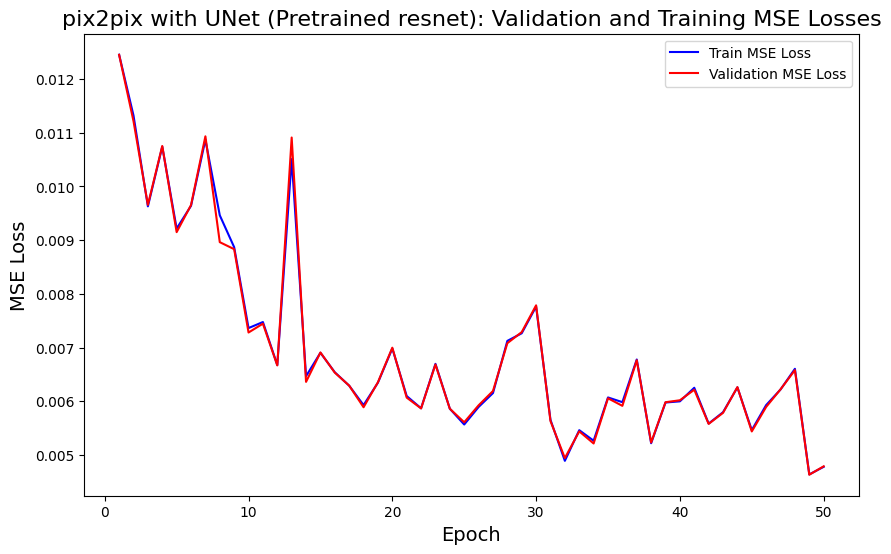

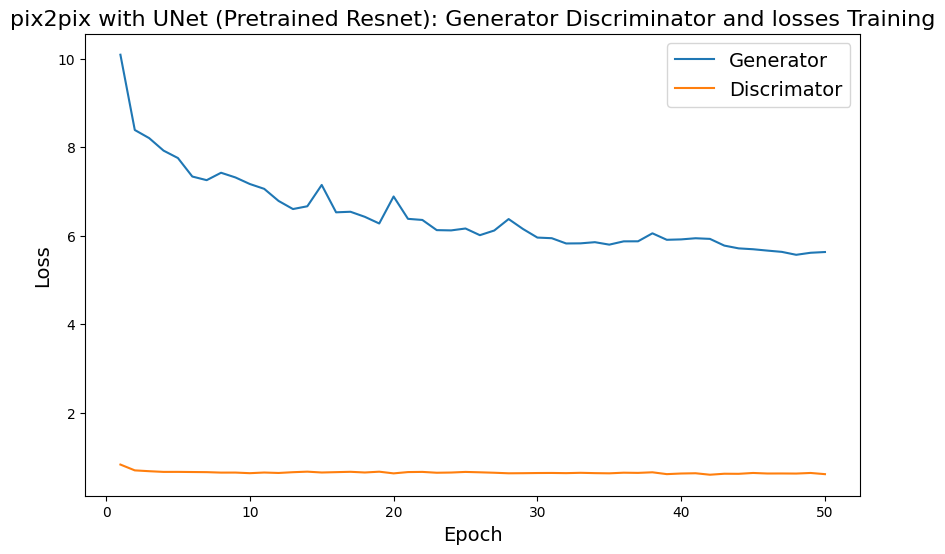

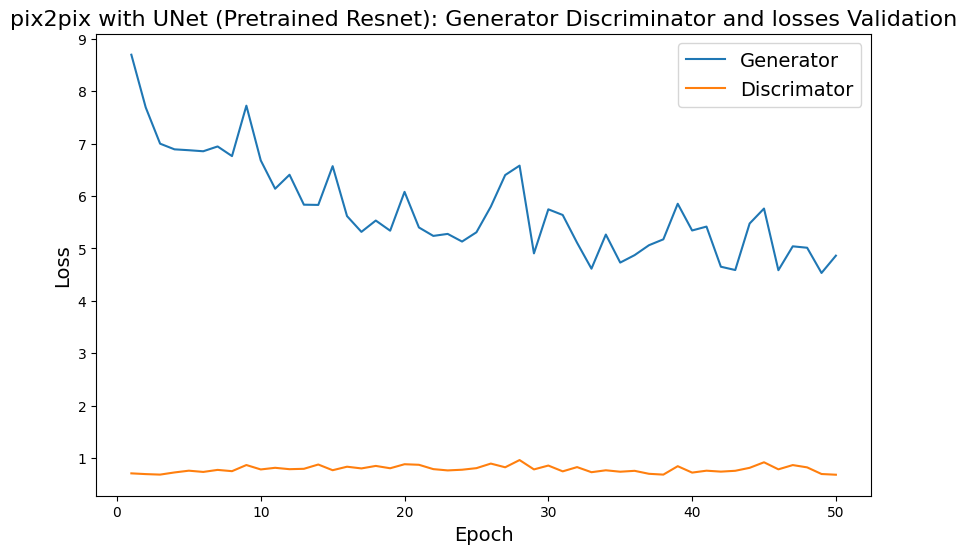

In [ ]:
# plot the generator, discriminator loss for the validation and training dataset.Save the weights learned.
plot_mseloss(mse_loss_val_losses_Unet_pretrained_gen_dis_model, mse_loss_train_losses_Unet_pretrained_gen_dis_model,
             'pix2pix with UNet (Pretrained resnet): Validation and Training MSE Losses',epochs_final)
plot_loss(losses_Unet_pretrained_gen_dis_model, 'pix2pix with UNet (Pretrained Resnet): Generator Discriminator and losses Training',epochs_final)
plot_loss(val_losses_Unet_pretrained_gen_dis_model, 'pix2pix with UNet (Pretrained Resnet): Generator Discriminator and losses Validation',epochs_final)
torch.save(Unet_pretrained_gen_dis_model.state_dict(), '/content/drive/MyDrive/ML_Project/Unet_pretrained_gen_dis_model_weights.pt')

In [ ]:
#list of entries of all loss values
print(losses_model_Unet_Scratch)
print(losses_Unetblock)
print(losses_Unet_pretrained_gen_dis_model)

# Analysis

In [ ]:
# plotting of the images for all the 3 models
from skimage.color.colorconv import rgb2gray
# add code that reads in the model weights and predicts the output test images
# get the mse loss for the dataset
# plot the original test images against the predicted test images

# loading all the models from the saved weights
model_Unet_Scratch = MainModel()
model_Unet_Scratch.load_state_dict(torch.load('/content/drive/MyDrive/ML_Project/model_Unet_Scratch.pt',
                                              map_location=torch.device('cpu')))

model initialized with norm initialization
model initialized with norm initialization


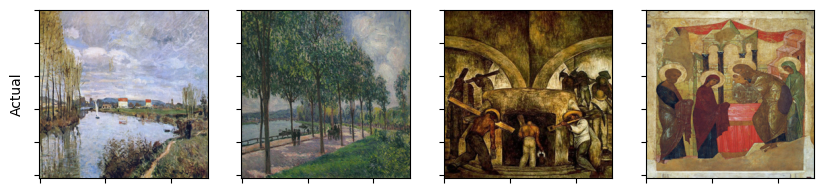

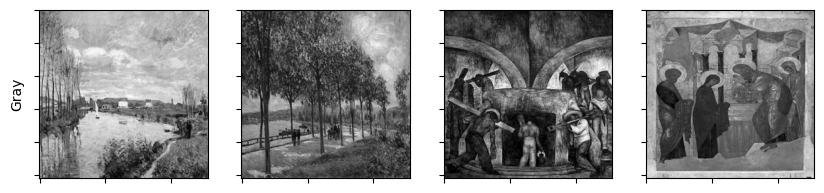

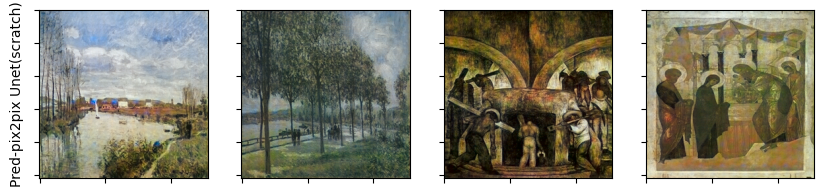

In [ ]:
# plotting of the images for all the 3 models


from skimage.color.colorconv import rgb2gray
# add code that reads in the model weights and predicts the output test images
# get the mse loss for the dataset
# plot the original test images against the predicted test images

# loading all the models from the saved weights
model_Unet_Scratch = MainModel()
model_Unet_Scratch.load_state_dict(torch.load('/content/drive/MyDrive/ML_Project/model_Unet_Scratch.pt',
                                              map_location=torch.device('cpu')))


from skimage import color
from PIL import Image
from skimage import io

# plotting the first 4 testing color images(Actual color images)
_, axes = plt.subplots(1, 4, figsize=(10, 10))
for i in range(len(axes)):
  axes[i].xaxis.set_ticklabels([])
  axes[i].yaxis.set_ticklabels([])
axes[0].set_ylabel('Actual')
for ax, img_path in zip(axes.flatten(), testing_path):
      img = Image.open(img_path)
      img = img.resize((256, 256))
      ax.imshow(img)

# plots the gray scale version ('L') component of the images
_, axes = plt.subplots(1, 4, figsize=(10, 10))
axes[0].set_ylabel('Gray')
for i in range(len(axes)):
  axes[i].xaxis.set_ticklabels([])
  axes[i].yaxis.set_ticklabels([])
for ax, img_path in zip(axes.flatten(), testing_path):
      img = Image.open(img_path)
      img = img.resize((256, 256))
      img = img.convert('L')
      ax.imshow(img,cmap='gray')

# plot the output predicted by the Pix2pix Unet from scratch
_, axes = plt.subplots(1, 4, figsize=(10, 10))
axes[0].set_ylabel('Pred-pix2pix Unet(scratch)')
for i in range(len(axes)):
  axes[i].xaxis.set_ticklabels([])
  axes[i].yaxis.set_ticklabels([])
for ax, img_path in zip(axes.flatten(), testing_path):
      img = Image.open(img_path)
      img = img.resize((256, 256))
      img = np.array(img)
      img_lab = rgb2lab(img).astype("float32")
      img_lab = transforms.ToTensor()(img_lab)
      img = img_lab[[0], ...] / 50. - 1.
      model_Unet_Scratch.eval()
      with torch.no_grad():
        preds = model_Unet_Scratch.net_G(img.unsqueeze(0).to(device))
      colorized = lab_to_rgb(img.unsqueeze(0), preds.cpu())[0]
      ax.imshow(colorized)

In [ ]:
net_G = build_res_unet(n_input=1, n_output=2, size=256)
net_G.load_state_dict(torch.load("/content/drive/MyDrive/ML_Project/res18-unet.pt", map_location=torch.device('cpu')))

model_Unet_resnet = net_G

model_Unet_Pretrained = MainModel(net_G)
model_Unet_Pretrained.load_state_dict(torch.load('/content/drive/MyDrive/ML_Project/Unet_pretrained_gen_dis_model_weights.pt',
                                                 map_location=torch.device('cpu')))

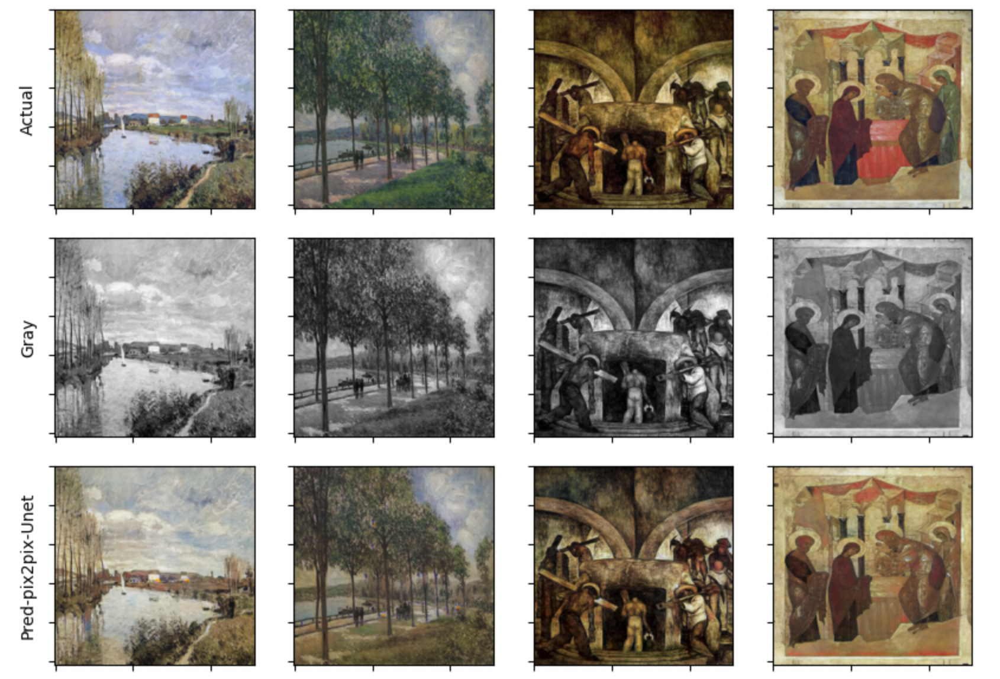

In [ ]:
from skimage import color
from PIL import Image
from skimage import io

# plotting the first 4 testing color images(Actual color images)
_, axes = plt.subplots(1, 4, figsize=(10, 10))
for i in range(len(axes)):
  axes[i].xaxis.set_ticklabels([])
  axes[i].yaxis.set_ticklabels([])
axes[0].set_ylabel('Actual')
for ax, img_path in zip(axes.flatten(), testing_path):
      img = Image.open(img_path)
      img = img.resize((256, 256))
      ax.imshow(img)

# plots the gray scale version ('L') component of the images
_, axes = plt.subplots(1, 4, figsize=(10, 10))
axes[0].set_ylabel('Gray')
for i in range(len(axes)):
  axes[i].xaxis.set_ticklabels([])
  axes[i].yaxis.set_ticklabels([])
for ax, img_path in zip(axes.flatten(), testing_path):
      img = Image.open(img_path)
      img = img.resize((256, 256))
      img = img.convert('L')
      ax.imshow(img,cmap='gray')

# plot the output predicted by the Pix2pix Unet from scratch
# plot the output predicted by Unet
# plot the output predicted by the Pix2pix Unet - resnet block (Pretrained))
_, axes = plt.subplots(1, 4, figsize=(10, 10))

axes[0].set_ylabel('Pred-pix2pix-Unet-Resnet')

for i in range(len(axes)):
  axes[i].xaxis.set_ticklabels([])
  axes[i].yaxis.set_ticklabels([])
for ax, img_path in zip(axes.flatten(), testing_path):
      img = Image.open(img_path)
      img = img.resize((256, 256))
      img = np.array(img)
      img_lab = rgb2lab(img).astype("float32")
      img_lab = transforms.ToTensor()(img_lab)
      img = img_lab[[0], ...] / 50. - 1.
      model_Unet_Scratch.eval()
      with torch.no_grad():
        # preds = model_Unet_Scratch.net_G(img.unsqueeze(0).to(device))
        preds = model_Unet_Pretrained.net_G(img.unsqueeze(0).to(device))
        # preds = model_Unet_resnet(img.unsqueeze(0).to(device))
      colorized = lab_to_rgb(img.unsqueeze(0), preds.cpu())[0]
      ax.imshow(colorized)

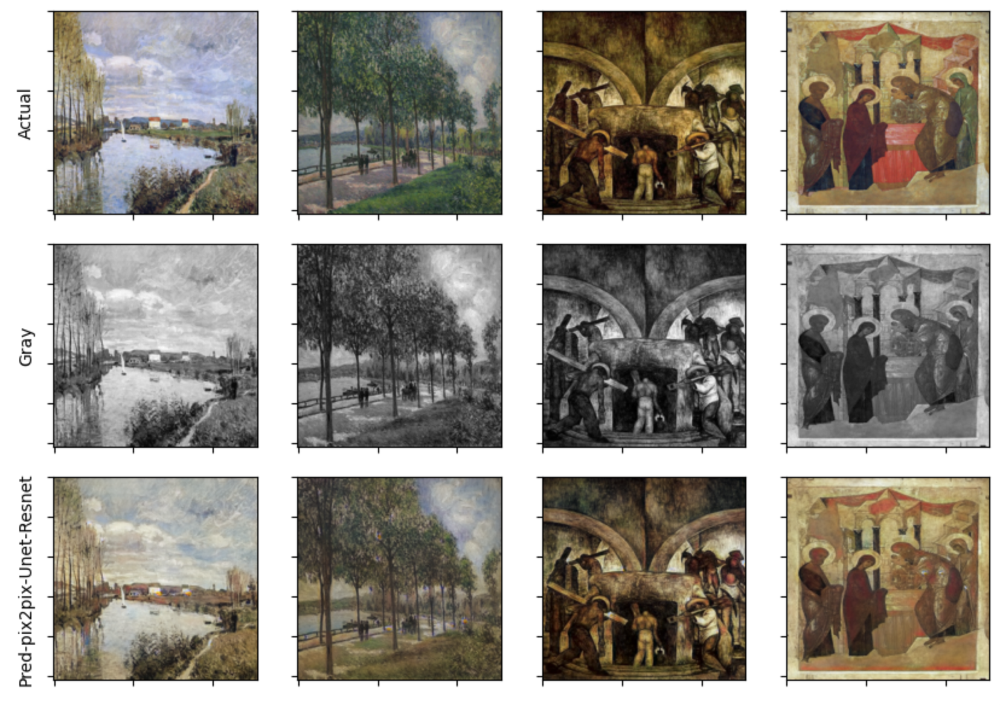

In [ ]:

from skimage.color.colorconv import rgb2gray

from skimage import color
from PIL import Image
from skimage import io

# plotting the first 4 testing color images(Actual color images)
_, axes = plt.subplots(1, 4, figsize=(10, 10))
for i in range(len(axes)):
  axes[i].xaxis.set_ticklabels([])
  axes[i].yaxis.set_ticklabels([])
axes[0].set_ylabel('Actual')
for ax, img_path in zip(axes.flatten(), testing_path):
      img = Image.open(img_path)
      img = img.resize((256, 256))
      ax.imshow(img)

# plots the gray scale version ('L') component of the images
_, axes = plt.subplots(1, 4, figsize=(10, 10))
axes[0].set_ylabel('Gray')
for i in range(len(axes)):
  axes[i].xaxis.set_ticklabels([])
  axes[i].yaxis.set_ticklabels([])
for ax, img_path in zip(axes.flatten(), testing_path):
      img = Image.open(img_path)
      img = img.resize((256, 256))
      img = img.convert('L')
      ax.imshow(img,cmap='gray')

# plot the output predicted by the Pix2pix Unet - resnet block (Pretrained))
_, axes = plt.subplots(1, 4, figsize=(10, 10))
axes[0].set_ylabel('Pred-pix2pix-Unet')
for i in range(len(axes)):
  axes[i].xaxis.set_ticklabels([])
  axes[i].yaxis.set_ticklabels([])
for ax, img_path in zip(axes.flatten(), testing_path):
      img = Image.open(img_path)
      img = img.resize((256, 256))
      img = np.array(img)
      img_lab = rgb2lab(img).astype("float32")
      img_lab = transforms.ToTensor()(img_lab)
      img = img_lab[[0], ...] / 50. - 1.
      model_Unet_Scratch.eval()
      with torch.no_grad():
        preds = model_Unet_Pretrained.net_G(img.unsqueeze(0).to(device))
      colorized = lab_to_rgb(img.unsqueeze(0), preds.cpu())[0]
      ax.imshow(colorized)


In [ ]:
# get the mse value on the test dataset for all the models
mse_loss_netG,loss_dictionary_netG = prediction_netG(test_dataset,model_Unet_resnet)
print("MSE Loss for Unet :",mse_loss_netG)



In [ ]:
mse_loss_net_Scratch,loss_dictionary_Scratch = prediction_netG(test_dataset,model_Unet_Scratch)
print("MSE Loss for Pix2Pix and Unet Resnet (Pretrained) :",mse_loss_net_Scratch)

  0%|          | 0/7 [00:00<?, ?it/s]

/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py:478: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


0.013555514493158885
MSE Loss for Pix2Pix and Unet Resnet (Pretrained) : 0.013555514493158885


In [ ]:
mse_loss_Pretrained,loss_dictionary_Pretrained = prediction_netG(test_dataset,model_Unet_Pretrained)
print("MSE Loss for Pix2Pix and Unet (Scratch) :",mse_loss_net_Scratch)

  0%|          | 0/7 [00:00<?, ?it/s]

/usr/local/lib/python3.9/dist-packages/torch/utils/data/dataloader.py:478: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


0.013319821629141058
MSE Loss for Pix2Pix and Unet (Scratch) : 0.013555514493158885


In [ ]:
mse_loss_Pretrained

0.013319821629141058